## Predict individual ema responses converted to binray

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import pingouin as pg
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve
from pathlib import Path
from flaml import AutoML
from flaml.automl.data import get_output_from_log
import importlib
import yaml
from joblib import Parallel, delayed
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    brier_score_loss,
)
from sklearn.model_selection import StratifiedGroupKFold
from alive_progress import alive_bar, alive_it
import pickle

from OPTIMA_momentary_ema_detection import format_axis as fa, plots, createEMAFeatures
from OPTIMA_momentary_ema_detection.predict_momentary_EMA import (
    generateHKFeatures,
    gatherUserMetrics,
    bootstrapPerformance,
)
from mhealth_feature_generation import simple_features as sf, dataloader as dl

## Load Definitions

In [2]:
from pyexpat import model


definitions = yaml.load(
    Path("./lib/definitions.yaml").read_text(), Loader=yaml.SafeLoader
)
config = yaml.load(Path("./lib/config.yaml").read_text(), Loader=yaml.SafeLoader)
parameters = yaml.load(
    Path("./lib/parameters.yaml").read_text(), Loader=yaml.SafeLoader
)
styles = yaml.load(Path("./lib/styles.yaml").read_text(), Loader=yaml.SafeLoader)

estimator_list = parameters["flaml_estimator_list"]
passive_feature_map = definitions["passive_feature_map"]
ucla_darkest_blue = styles["ucla_darkest_blue"]
ucla_blue = styles["ucla_blue"]
ucla_lighter_blue = styles["ucla_lighter_blue"]
ucla_darkest_gold = styles["ucla_darkest_gold"]
windows = ["15Min", "30Min", "1h", "2h", "3h"]

# time_budget = 60
time_budget = 200

cache_folder = Path(config["cache_path"], "momentary_ema")
if not cache_folder.exists():
    cache_folder.mkdir(parents=True)


USE_CACHE = True
USE_SUBSAMPLE = False


if USE_SUBSAMPLE:
    time_budget = 10
    USE_CACHE = False


momentary_features = [
    "audioExposure_hours",
    "audioExposure_mean",
    "audioExposure_count",
    "audioExposure_entries",
    *[
        f"{exercise}_{agg}"
        for exercise in [
            "StepCount",
            "BasalEnergyBurned",
            "ActiveEnergyBurned",
            "AppleExerciseTime",
        ]
        for agg in ["sum", "count", "duration"]
    ],
    *[
        f"HeartRate_{agg}"
        for agg in [
            "mean",
            "std",
            "min",
            "max",
            "count",
            "intercept",
            "slope",
        ]
    ],
    *[
        f"{vital}_{agg}"
        for vital in [
            "RespiratoryRate",
            "HeartRateVariabilitySDNN",
            "OxygenSaturation",
        ]
        for agg in [
            "mean",
            "count",
        ]
    ],
]

sleep_features = [
    "sleep_sleepDuration_day",
    "sleep_sleepEfficiency_day",
    "sleep_Awake_mean",
    "sleep_Awake_count",
    "sleep_bedrestNoise_day",
    "sleep_sleepOnsetLatency_day",
    "sleep_sleepOnsetHours_day",
    "sleep_sleepOffsetHours_day",
    "sleep_bedrestOffsetHours_day",
    "sleep_bedrestOnsetHours_day",
    "sleep_bedrestDuration_day",
]
print(
    "n_momentary_features",
    len(momentary_features),
    "n_sleep_features",
    len(sleep_features),
)
feature_set_name_map = {
    "momentary_hk": "Momentary",
    "momentary_hk_sleep": "With Sleep",
}
model_name_map = definitions["model_name_map"]
use_qids = [*definitions["likert_qids"], *definitions["bool_qids"]]
outcomes = [definitions["qid_label_map"][qid] for qid in use_qids]


if USE_SUBSAMPLE:
    outcomes = outcomes[:3]

n_momentary_features 29 n_sleep_features 11


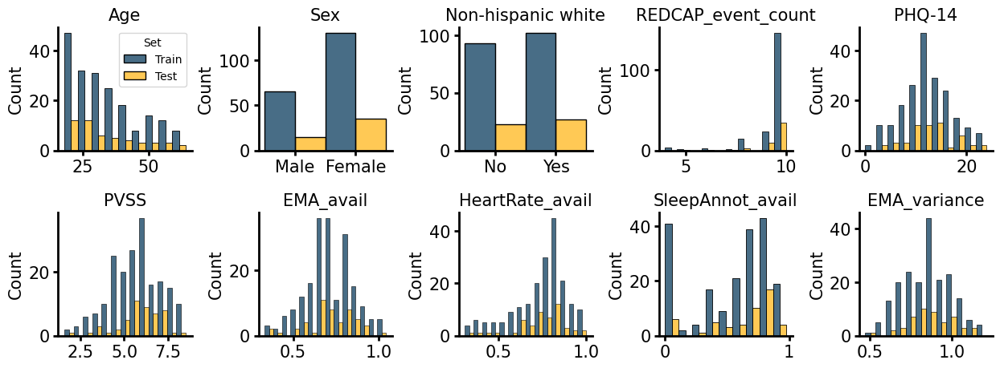

In [3]:
ema_train_test_split = pd.read_csv(
    config["momentary_ema_train_test_split_path"], sep="\t"
).rename(
    columns={
        "race-ethnicity": "Non-hispanic white",
    }
)


if USE_SUBSAMPLE:
    ema_train_test_split = ema_train_test_split.sample(n=30, random_state=42)

train_users = ema_train_test_split[ema_train_test_split["batch"] == 1]["user_id"].values
test_users = ema_train_test_split[ema_train_test_split["batch"] == 2]["user_id"].values

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 5))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for col, ax in zip(ema_train_test_split.columns[1::], axes.flatten()):
    bins = "auto"
    if col == "REDCAP_event_count":
        bins = 10

    ema_train_test_split["Set"] = ema_train_test_split["batch"].map(
        {1: "Train", 2: "Test"}
    )
    sns.histplot(
        data=ema_train_test_split,
        x=col,
        hue="Set",
        bins=bins,
        ax=ax,
        legend=(col == "Age"),
        palette={"Train": ucla_darkest_blue, "Test": ucla_darkest_gold},
        multiple="dodge",
    )
    ax.set_title(col.split("Scan-")[-1], fontsize=15)
    ax.set_ylabel("Count")
    ax.set_xlabel("")
    fa.despine_thicken_axes(ax, fontsize=15)

In [4]:
ema = createEMAFeatures.loadEMA(
    ema_path=config["ema_path"],
    timeshift_map=pd.read_csv(config["timeshift_path"])
    .rename(columns={"eid": "user_id"})
    .drop(columns=["record_id"])
    .drop_duplicates(),
    qid_label_map=definitions["qid_label_map"],
)

ema = ema[ema.user_id.isin(list(test_users) + list(train_users))]
print(ema.session_uuid.nunique())

24273


In [5]:
ema_train_test_split.groupby("batch")["Scan-PVSS"].describe()

,count,mean,std,min,25%,50%,75%,max
batch,,,,,,,,
1,195.0,5.713309,1.428399,2.047619,4.714286,5.809524,6.619048,8.523810
2,50.0,5.817143,1.338334,1.571429,5.297619,5.952381,6.702381,8.142857


In [6]:
importlib.reload(createEMAFeatures)
ema["session_start"] = ema.groupby(
    ["user_id", "session_uuid"]
).response_time_loc.transform("min")
qc_ema = createEMAFeatures.qcEMASession(
    ema,
    ema_session_duration_range_seconds=parameters["ema_session_duration_range_seconds"],
    user_id_col="user_id",
)
qc_ema["binary_answer"] = qc_ema.answer_id != 1
qc_ema.loc[
    qc_ema.q_id.isin(definitions["bool_qids"]),
    "binary_answer",
] = qc_ema.loc[
    qc_ema.q_id.isin(definitions["bool_qids"]), "answer_id"
].map({1: 1, 2: 0})
print(qc_ema.session_uuid.nunique())

Removed 461 sessions with duration outside of range [10, 300]
23812


/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/2270065799.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1 1 0 ... 1 0 0]' has dtype incompatible with bool, please explicitly cast to a compatible dtype first.
  qc_ema.loc[


,X,Y,method,alternative,n,r,CI95%,p-unc,p-corr,p-adjust,power
167,effort,anxious,spearman,two-sided,23691,0.094158,"[0.08, 0.11]",8.522747e-48,1.704549e-47,holm,1.0
41,anxious,effort,spearman,two-sided,23691,0.094158,"[0.08, 0.11]",8.522747e-48,1.704549e-47,holm,1.0
166,effort,stressed,spearman,two-sided,23693,0.114399,"[0.1, 0.13]",7.671612e-70,3.068645e-69,holm,1.0
26,stressed,effort,spearman,two-sided,23693,0.114399,"[0.1, 0.13]",7.671612e-70,3.068645e-69,holm,1.0
168,effort,annoyed,spearman,two-sided,23692,0.132633,"[0.12, 0.15]",1.954513e-93,1.172708e-92,holm,1.0
...,...,...,...,...,...,...,...,...,...,...,...
96,motivated,motivated,spearman,two-sided,23792,1.000000,"[1.0, 1.0]",0.000000e+00,0.000000e+00,holm,1.0
97,motivated,engaged,spearman,two-sided,23777,0.688211,"[0.68, 0.69]",0.000000e+00,0.000000e+00,holm,1.0
99,motivated,anticipatory,spearman,two-sided,23701,-0.392133,"[-0.4, -0.38]",0.000000e+00,0.000000e+00,holm,1.0
100,motivated,consummatory,spearman,two-sided,23691,-0.453144,"[-0.46, -0.44]",0.000000e+00,0.000000e+00,holm,1.0


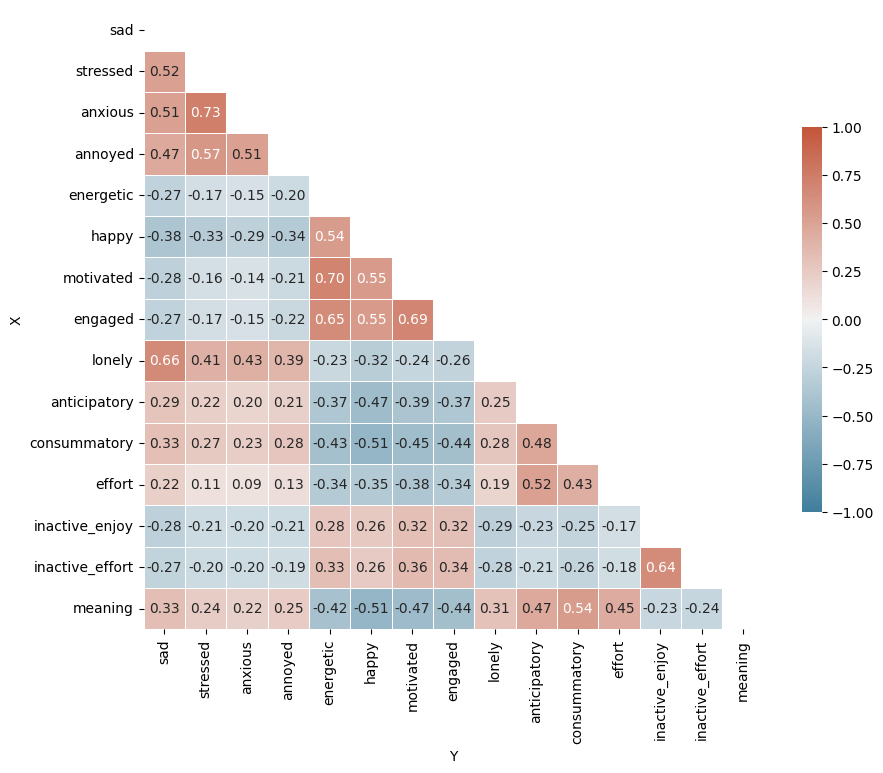

In [7]:
qc_ema_piv = (
    qc_ema[qc_ema.q_id.isin(use_qids)]
    .pivot_table(
        index="session_uuid",
        columns="question_label",
        values="answer_id",
        aggfunc="first",
    )
    .astype(float)
)

ema_corr = pg.pairwise_corr(
    data=qc_ema_piv,
    columns=[outcomes, outcomes],
    method="spearman",
    padjust="holm",
)


ema_corr_piv = ema_corr.pivot_table(
    index="X", columns="Y", values="r", aggfunc="first"
).reindex(index=outcomes, columns=outcomes)
upper_mask = np.triu(np.ones_like(ema_corr_piv, dtype=bool))

fig, ax = plt.subplots(figsize=(10, 10))
plots.heatmap_correlation(ema_corr_piv, ax=ax, mask=upper_mask)

ema_corr.sort_values(
    by="p-corr",
    ascending=False,
)

# Compare EMA to mTurk dataset

In [8]:
phq8_response_map = {
    "Not at all": 0,
    "Less than half the days": 1,
    "More than half the days": 2,
    "Nearly every day": 3,
}
pvss_response_map = {
    "1: Extremely Untrue of me": 1,
    "2: Very untrue of me": 2,
    "3: Moderately untrue of me": 3,
    "4: Slightly untrue of me": 4,
    "5: Neutral": 5,
    "6: Slightly true of me": 6,
    "7: Moderately true of me": 7,
    "8: Very true of me": 8,
    "9: Extremely true of me": 9,
}

In [9]:
mturk_data = pd.read_excel(config["mTurk_data_path"], index_col="ResponseId")

pvss_item_cols = [c for c in mturk_data.columns if "PVSS_Matrix" in c]
phq_item_cols = [
    c
    for c in mturk_data.columns
    if "PHQ_matrix_partA" in c and int(c.split("_")[-1]) <= 8
]
mturk_data["PVSS Total"] = (
    mturk_data[pvss_item_cols].dropna().map(lambda x: pvss_response_map[x]).mean(axis=1)
)
mturk_data["PHQ-8 Total"] = (
    mturk_data[phq_item_cols].dropna().map(lambda x: phq8_response_map[x]).sum(axis=1)
)
mturk_data["Sex"] = mturk_data["Sex_at_birth"]
mturk_data = mturk_data[mturk_data.Age.between(18, 65)]

In [10]:
optima_comp = ema_train_test_split.copy().rename(
    columns={"Scan-PHQ-14": "PHQ-8 Total", "Scan-PVSS": "PVSS Total"}
)
optima_comp["cohort"] = "OPTIMA"
mturk_data["cohort"] = "Population Sample"
comp_cols = ["Sex", "Age", "PHQ-8 Total", "PVSS Total"]
comp_data = pd.concat(
    [optima_comp[comp_cols + ["cohort"]], mturk_data[comp_cols + ["cohort"]]]
)

In [11]:
results = []
for col in comp_cols:
    if col == "Sex":
        expected_, observed_, res = pg.chi2_independence(
            data=comp_data, x="cohort", y=col, correction=False
        )
        res = res[res.test == "pearson"]
        res.rename({"pval": "p-val"}, axis=1, inplace=True)
    else:
        res = (
            pg.mwu(
                x=comp_data[comp_data["cohort"] == "OPTIMA"][col],
                y=comp_data[comp_data["cohort"] == "Population Sample"][col],
            )
            .reset_index()
            .rename(columns={"index": "test"})
        )
        res["median_difference"] = (
            comp_data[comp_data["cohort"] == "OPTIMA"][col].median()
            - comp_data[comp_data["cohort"] == "Population Sample"][col].median()
        )
    res["col"] = col
    results.append(res)
result_df = pd.concat(results)
result_df["p-corr"] = pg.multicomp(result_df["p-val"].astype(float), method="bonf")[1]
result_df

,test,lambda,chi2,dof,p-val,cramer,power,col,U-val,alternative,RBC,CLES,median_difference,p-corr
0,pearson,1.0,56.359109,1.0,6.037295e-14,0.203345,1.0,Sex,NaN,NaN,NaN,NaN,NaN,2.414918e-13
0,MWU,NaN,NaN,NaN,1.028524e-06,NaN,NaN,Age,109707.0,two-sided,-0.198956,0.400522,-2.000000,4.114096e-06
0,MWU,NaN,NaN,NaN,1.528267e-30,NaN,NaN,PHQ-8 Total,94985.0,two-sided,0.514429,0.757215,8.000000,6.113068e-30
0,MWU,NaN,NaN,NaN,5.289503e-17,NaN,NaN,PVSS Total,39803.5,two-sided,-0.375141,0.312429,-1.047619,2.115801e-16


In [12]:
xy_annot_dict = {
    "Age": (40, 125),
    "PHQ-8 Total": (14, 120),
    "PVSS Total": (0.9, 40),
}

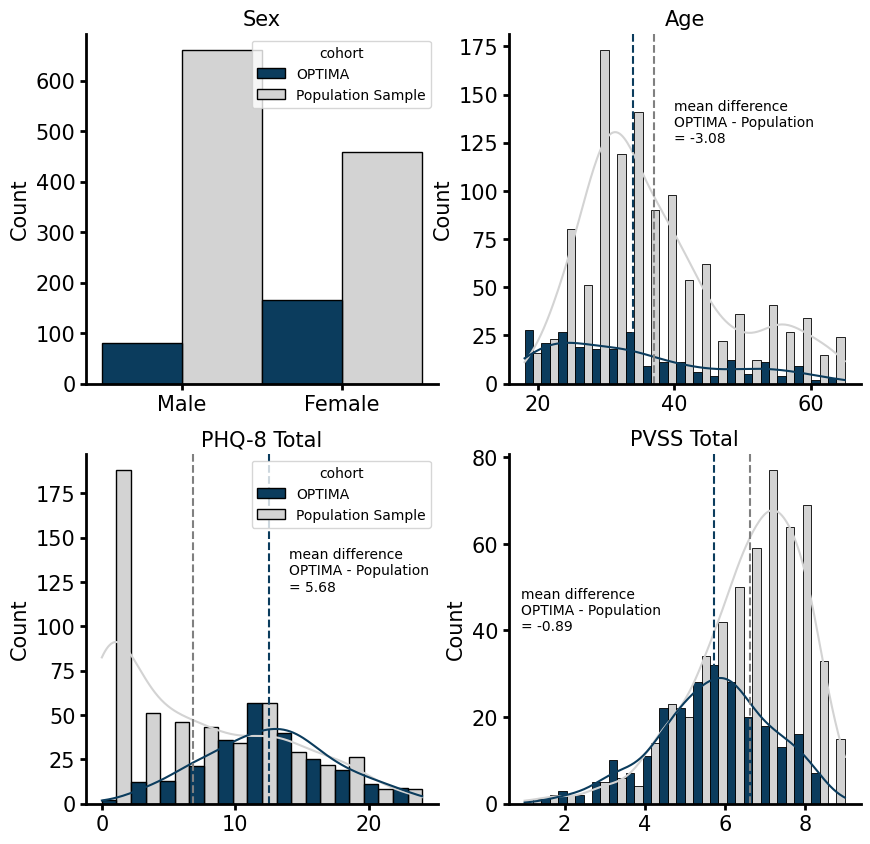

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
for i, ax in enumerate(axes.flatten()):
    col = comp_cols[i]
    kde = True
    if col == "Sex":
        kde = False
    sns.histplot(
        data=comp_data,
        x=col,
        hue="cohort",
        ax=ax,
        kde=kde,
        alpha=1,
        multiple="dodge",
        palette=[ucla_darkest_blue, "lightgray"],
        legend=i % 2 == 0,
    )
    if col != "Sex":
        # Add mean value lines
        ax.axvline(
            x=comp_data[comp_data["cohort"] == "OPTIMA"][col].mean(),
            color=ucla_darkest_blue,
            linestyle="--",
        )
        ax.axvline(
            x=comp_data[comp_data["cohort"] == "Population Sample"][col].mean(),
            color="gray",
            linestyle="--",
        )
        # Annotate mean difference
        ax.annotate(
            xy=xy_annot_dict[col],
            text=f"mean difference\nOPTIMA - Population\n= {comp_data[comp_data['cohort'] == 'OPTIMA'][col].mean() - comp_data[comp_data['cohort'] == 'Population Sample'][col].mean():.2f}",
            transform=ax.transAxes,
            fontsize=10,
        )

    fa.despine_thicken_axes(ax, fontsize=15)
    ax.set_title(col, fontsize=15)
    ax.set_xlabel("")

In [14]:
comp_data.groupby("cohort")[comp_cols[1:]].aggregate(
    ["min", "mean", "max", "std", "count"]
).T

cohort                 OPTIMA  Population Sample
Age         min     18.000000          18.000000
            mean    33.885714          36.961538
            max     64.000000          65.000000
            std     12.223801          10.605709
            count  245.000000        1118.000000
PHQ-8 Total min      0.000000           0.000000
            mean    12.534694           6.857422
            max     24.000000          24.000000
            std      4.863276           6.384698
            count  245.000000         512.000000
PVSS Total  min      1.571429           1.000000
            mean     5.734500           6.625549
            max      8.523810           9.000000
            std      1.408432           1.367878
            count  245.000000         520.000000

In [15]:
affect_ema = [
    "EMA_likert_sad",
    "EMA_likert_stressed",
    "EMA_likert_anxious",
    "EMA_likert_annoy_irr",
    "EMA_likert_energetic",
    "EMA_likert_happy",
    "EMA_likert_motivated",
    "EMA_likert_engaged",
    "EMA_likert_lonely",
]
reward_ema = [
    "EMA_anticipatory",
    "EMA_consummatory",
    "EMA_effort",
    "EMA_inactive_enjoy",
    "EMA_inactive_effort",
    "EMA_meaning_purpose",
]
ema_optima_order = [definitions["qid_label_map"][i] for i in range(2, 17)]
mTurk_optima_ema_label = {
    c: ema_optima_order[i] for i, c in enumerate([*affect_ema, *reward_ema])
}
mTurk_optima_ema_label

{'EMA_likert_sad': 'sad',
 'EMA_likert_stressed': 'stressed',
 'EMA_likert_anxious': 'anxious',
 'EMA_likert_annoy_irr': 'annoyed',
 'EMA_likert_energetic': 'energetic',
 'EMA_likert_happy': 'happy',
 'EMA_likert_motivated': 'motivated',
 'EMA_likert_engaged': 'engaged',
 'EMA_likert_lonely': 'lonely',
 'EMA_anticipatory': 'anticipatory',
 'EMA_consummatory': 'consummatory',
 'EMA_effort': 'effort',
 'EMA_inactive_enjoy': 'inactive_enjoy',
 'EMA_inactive_effort': 'inactive_effort',
 'EMA_meaning_purpose': 'meaning'}

In [16]:
mTurk_ema = mturk_data[[*affect_ema, *reward_ema]].copy()


def affectEMAProcess(x):
    if x == "nan":
        return None
    return int(x.split(":")[0])


mTurk_ema.loc[:, affect_ema] = mTurk_ema[affect_ema].astype(str).map(affectEMAProcess)

mTurk_ema.loc[:, reward_ema] = mTurk_ema[reward_ema].astype(float)
mTurk_ema = mTurk_ema.rename(columns=mTurk_optima_ema_label).dropna(how="all")
mTurk_ema["cohort"] = "Population Sample"

In [17]:
optima_reward_cols = [
    "anticipatory",
    "consummatory",
    "effort",
    "inactive_enjoy",
    "inactive_effort",
    "meaning",
]
optima_affect_cols = [
    "sad",
    "stressed",
    "anxious",
    "annoyed",
    "energetic",
    "happy",
    "motivated",
    "engaged",
    "lonely",
]

In [18]:
qc_ema["answer"] = qc_ema["answer_id"]
qc_ema.loc[qc_ema.q_id.isin(definitions["bool_qids"]), "answer"] = qc_ema[
    qc_ema.q_id.isin(definitions["bool_qids"])
]["answer_id"].map({1: 1, 2: 0})
ema_participant_resp = (
    qc_ema.groupby(["user_id", "question_label"])
    .answer.median()
    .unstack()[ema_optima_order]
)
ema_participant_resp["cohort"] = "OPTIMA"

ema_comp = pd.concat([mTurk_ema, ema_participant_resp])
ema_comp[optima_reward_cols] = ema_comp[optima_reward_cols]

In [19]:
results = []
for col in outcomes:
    if col in optima_reward_cols:
        expected_, observed_, res = pg.chi2_independence(
            data=ema_comp, x="cohort", y=col, correction=False
        )
        res = res[res.test == "pearson"]
        res.rename({"pval": "p-val"}, axis=1, inplace=True)
    else:
        res = (
            pg.mwu(
                x=ema_comp[ema_comp["cohort"] == "OPTIMA"][col]
                .dropna()
                .astype("float"),
                y=ema_comp[ema_comp["cohort"] == "Population Sample"][col]
                .dropna()
                .astype("float"),
            )
            .reset_index()
            .rename(columns={"index": "test"})
        )
    res["OPTIMA_mean"] = ema_comp[ema_comp["cohort"] == "OPTIMA"][col].mean()
    res["General_mean"] = ema_comp[ema_comp["cohort"] == "Population Sample"][
        col
    ].mean()
    res["median_difference"] = (
        ema_comp[ema_comp["cohort"] == "OPTIMA"][col].median()
        - ema_comp[ema_comp["cohort"] == "Population Sample"][col].median()
    )
    res["mean_difference"] = (
        ema_comp[ema_comp["cohort"] == "OPTIMA"][col].mean()
        - ema_comp[ema_comp["cohort"] == "Population Sample"][col].mean()
    )
    res["col"] = col
    results.append(res)
ema_result_df = pd.concat(results)
ema_result_df["p-corr"] = pg.multicomp(
    ema_result_df["p-val"].astype(float), method="bonf"
)[1]
ema_result_df[ema_result_df["p-corr"] < 0.05]

/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/pingouin/contingency.py:151: UserWarning: Low count on observed frequencies.
  warnings.warn(f"Low count on {name} frequencies.")
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/pingouin/contingency.py:151: UserWarning: Low count on expected frequencies.
  warnings.warn(f"Low count on {name} frequencies.")
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/scipy/stats/_stats_py.py:7663: RuntimeWarning: divide by zero encountered in power
  terms = f_obs * ((f_obs / f_exp)**lambda_ - 1)
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/scipy/stats/_stats_py.py:7663: RuntimeWarning: invalid value encountered in multiply
  terms = f_obs * ((f_obs / f_exp)**lambda_ - 1)
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.ven

,test,U-val,alternative,p-val,RBC,CLES,OPTIMA_mean,General_mean,median_difference,mean_difference,col,lambda,chi2,dof,cramer,power,p-corr
0,MWU,78786.5,two-sided,1.340096e-09,0.261088,0.630544,2.426531,2.078431,0.0,0.348099,stressed,NaN,NaN,NaN,NaN,NaN,2.010144e-08
0,MWU,80105.5,two-sided,4.059697e-11,0.282201,0.641100,2.334694,1.950980,1.0,0.383713,anxious,NaN,NaN,NaN,NaN,NaN,6.089545e-10
0,MWU,71762.0,two-sided,2.949814e-04,0.148651,0.574326,1.826531,1.731373,1.0,0.095158,annoyed,NaN,NaN,NaN,NaN,NaN,4.424721e-03
0,MWU,38284.5,two-sided,2.377806e-19,-0.387203,0.306399,2.114286,2.839216,-1.0,-0.724930,energetic,NaN,NaN,NaN,NaN,NaN,3.566709e-18
0,MWU,34501.0,two-sided,6.678940e-25,-0.447763,0.276118,2.126531,3.009804,-1.0,-0.883273,happy,NaN,NaN,NaN,NaN,NaN,1.001841e-23
0,MWU,26040.0,two-sided,4.851120e-41,-0.583193,0.208403,2.197959,3.309804,-1.0,-1.111845,motivated,NaN,NaN,NaN,NaN,NaN,7.276681e-40
0,MWU,23979.5,two-sided,1.592558e-45,-0.616174,0.191913,2.381633,3.574510,-2.0,-1.192877,engaged,NaN,NaN,NaN,NaN,NaN,2.388837e-44
0,pearson,NaN,NaN,2.737350e-12,NaN,NaN,0.479592,0.734774,-1.0,-0.255182,anticipatory,1.0,53.248061,2.0,0.265570,1.0,4.106025e-11
0,pearson,NaN,NaN,1.380857e-15,NaN,NaN,0.426531,0.715128,-1.0,-0.288597,consummatory,1.0,68.432145,2.0,0.301062,1.0,2.071285e-14
0,pearson,NaN,NaN,5.701050e-18,NaN,NaN,0.302041,0.638507,-1.0,-0.336466,effort,1.0,79.411763,2.0,0.324316,1.0,8.551574e-17


Text(0.5, 1.0, 'Reward EMA items')

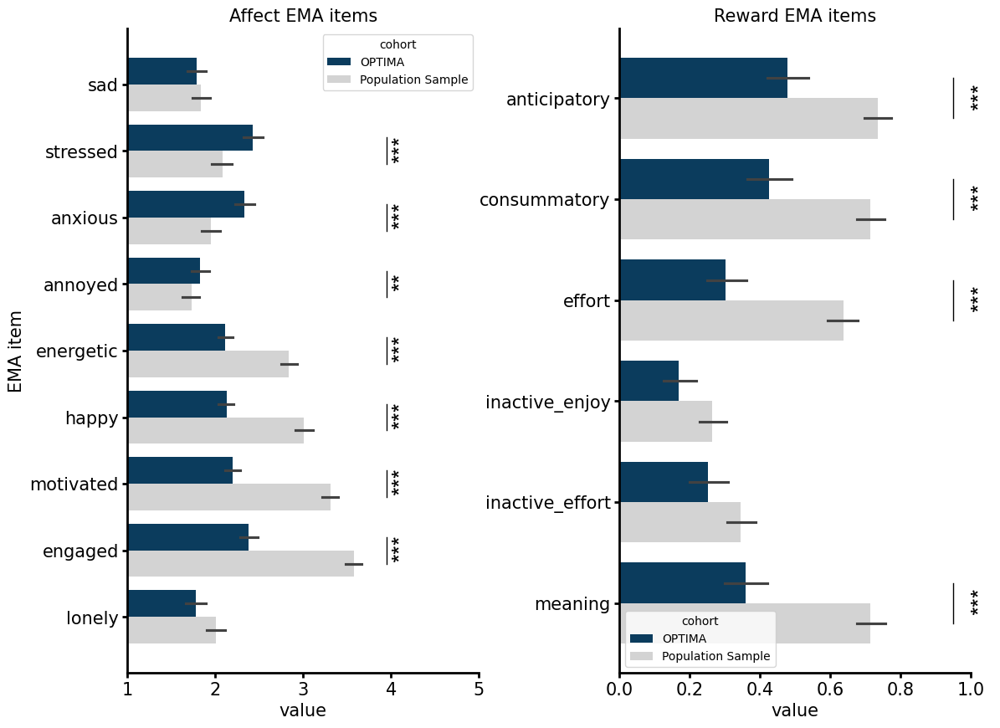

In [20]:
fig, axes = plt.subplots(ncols=2, figsize=(13, 10))
plt.subplots_adjust(hspace=0.5, wspace=0.4)
ema_comp_melt = ema_comp.melt(id_vars=["cohort"])
ax = axes[0]
sns.barplot(
    data=ema_comp_melt,
    x="value",
    y="variable",
    hue="cohort",
    ax=ax,
    order=optima_affect_cols,
    saturation=1,
    hue_order=["OPTIMA", "Population Sample"],
    palette=[ucla_darkest_blue, "lightgray"],
)
ax.set_xlim(1, 5)
fa.despine_thicken_axes(ax, fontsize=15)
# Annotate wilcoxon results on plot
for i, c in enumerate(optima_affect_cols):
    res = ema_result_df[ema_result_df["col"] == c]
    if res["p-corr"].values[0] < 0.05:
        stars = "*"
        if res["p-corr"].values[0] < 0.01:
            stars = "**"
        if res["p-corr"].values[0] < 0.001:
            stars = "***"
        ax.text(
            x=4,
            y=i - 0.03,
            s=stars,
            va="center",
            fontfamily="arial",
            fontsize=20,
            rotation=90,
        )
        ax.plot([3.95, 3.95], [i - 0.2, i + 0.2], lw=1, color="k")
ax.set_ylabel("EMA item")
ax.set_title("Affect EMA items", fontsize=15)

ax = axes[1]
sns.barplot(
    data=ema_comp_melt,
    x="value",
    y="variable",
    hue="cohort",
    saturation=1,
    ax=ax,
    order=optima_reward_cols,
    hue_order=["OPTIMA", "Population Sample"],
    palette=[ucla_darkest_blue, "lightgray"],
)
fa.despine_thicken_axes(ax, fontsize=15)
ax.set_xlim(0, 1)
ax.set_ylabel("")
for i, c in enumerate(optima_reward_cols):
    res = ema_result_df[ema_result_df["col"] == c]
    if res["p-corr"].values[0] < 0.05:
        stars = "*"
        if res["p-corr"].values[0] < 0.01:
            stars = "**"
        if res["p-corr"].values[0] < 0.001:
            stars = "***"
        ax.text(
            x=1,
            y=i - 0.02,
            s=stars,
            va="center",
            fontfamily="arial",
            fontsize=20,
            rotation=90,
        )
        ax.plot([0.95, 0.95], [i - 0.2, i + 0.2], lw=1, color="k")

ax.set_title("Reward EMA items", fontsize=15)

In [21]:
ema_result_df[ema_result_df["p-corr"] < 0.05]

,test,U-val,alternative,p-val,RBC,CLES,OPTIMA_mean,General_mean,median_difference,mean_difference,col,lambda,chi2,dof,cramer,power,p-corr
0,MWU,78786.5,two-sided,1.340096e-09,0.261088,0.630544,2.426531,2.078431,0.0,0.348099,stressed,NaN,NaN,NaN,NaN,NaN,2.010144e-08
0,MWU,80105.5,two-sided,4.059697e-11,0.282201,0.641100,2.334694,1.950980,1.0,0.383713,anxious,NaN,NaN,NaN,NaN,NaN,6.089545e-10
0,MWU,71762.0,two-sided,2.949814e-04,0.148651,0.574326,1.826531,1.731373,1.0,0.095158,annoyed,NaN,NaN,NaN,NaN,NaN,4.424721e-03
0,MWU,38284.5,two-sided,2.377806e-19,-0.387203,0.306399,2.114286,2.839216,-1.0,-0.724930,energetic,NaN,NaN,NaN,NaN,NaN,3.566709e-18
0,MWU,34501.0,two-sided,6.678940e-25,-0.447763,0.276118,2.126531,3.009804,-1.0,-0.883273,happy,NaN,NaN,NaN,NaN,NaN,1.001841e-23
0,MWU,26040.0,two-sided,4.851120e-41,-0.583193,0.208403,2.197959,3.309804,-1.0,-1.111845,motivated,NaN,NaN,NaN,NaN,NaN,7.276681e-40
0,MWU,23979.5,two-sided,1.592558e-45,-0.616174,0.191913,2.381633,3.574510,-2.0,-1.192877,engaged,NaN,NaN,NaN,NaN,NaN,2.388837e-44
0,pearson,NaN,NaN,2.737350e-12,NaN,NaN,0.479592,0.734774,-1.0,-0.255182,anticipatory,1.0,53.248061,2.0,0.265570,1.0,4.106025e-11
0,pearson,NaN,NaN,1.380857e-15,NaN,NaN,0.426531,0.715128,-1.0,-0.288597,consummatory,1.0,68.432145,2.0,0.301062,1.0,2.071285e-14
0,pearson,NaN,NaN,5.701050e-18,NaN,NaN,0.302041,0.638507,-1.0,-0.336466,effort,1.0,79.411763,2.0,0.324316,1.0,8.551574e-17


In [22]:
ema_result_df[
    ["col", "p-corr", "OPTIMA_mean", "General_mean", "mean_difference"]
].to_clipboard(index=False)
ema_result_df[["col", "p-corr", "OPTIMA_mean", "General_mean", "mean_difference"]]

,col,p-corr,OPTIMA_mean,General_mean,mean_difference
0,sad,1.000000e+00,1.783673,1.837255,-0.053581
0,stressed,2.010144e-08,2.426531,2.078431,0.348099
0,anxious,6.089545e-10,2.334694,1.950980,0.383713
0,annoyed,4.424721e-03,1.826531,1.731373,0.095158
0,energetic,3.566709e-18,2.114286,2.839216,-0.724930
0,happy,1.001841e-23,2.126531,3.009804,-0.883273
0,motivated,7.276681e-40,2.197959,3.309804,-1.111845
0,engaged,2.388837e-44,2.381633,3.574510,-1.192877
0,lonely,1.000000e+00,1.775510,2.009804,-0.234294
0,anticipatory,4.106025e-11,0.479592,0.734774,-0.255182


cohort                 OPTIMA Population Sample
sad             min       1.0               1.0
                median    2.0               1.0
                max       5.0               5.0
stressed        min       1.0               1.0
                median    2.0               2.0
                max       5.0               5.0
anxious         min       1.0               1.0
                median    2.0               1.0
                max       5.0               5.0
annoyed         min       1.0               1.0
                median    2.0               1.0
                max       5.0               5.0
energetic       min       1.0               1.0
                median    2.0               3.0
                max       4.0               5.0
happy           min       1.0               1.0
                median    2.0               3.0
                max       4.0               5.0
motivated       min       1.0               1.0
                median    2.0               3.0
                max       4.0               5.0
engaged         min       1.0               1.0
                median    2.0               4.0
                max       5.0               5.0
lonely          min       1.0               1.0
                median    2.0               1.0
                max       5.0               5.0
anticipatory    min       0.0               0.0
                median    0.0               1.0
                max       1.0               1.0
consummatory    min       0.0               0.0
                median    0.0               1.0
                max       1.0               1.0
effort          min       0.0               0.0
                median    0.0               1.0
                max       1.0               1.0
inactive_enjoy  min       0.0               0.0
                median    0.0               0.0
                max       1.0               1.0
inactive_effort min       0.0               0.0
                median    0.0               0.0
                max       1.0               1.0
meaning         min       0.0               0.0
                median    0.0               1.0
                max       1.0               1.0

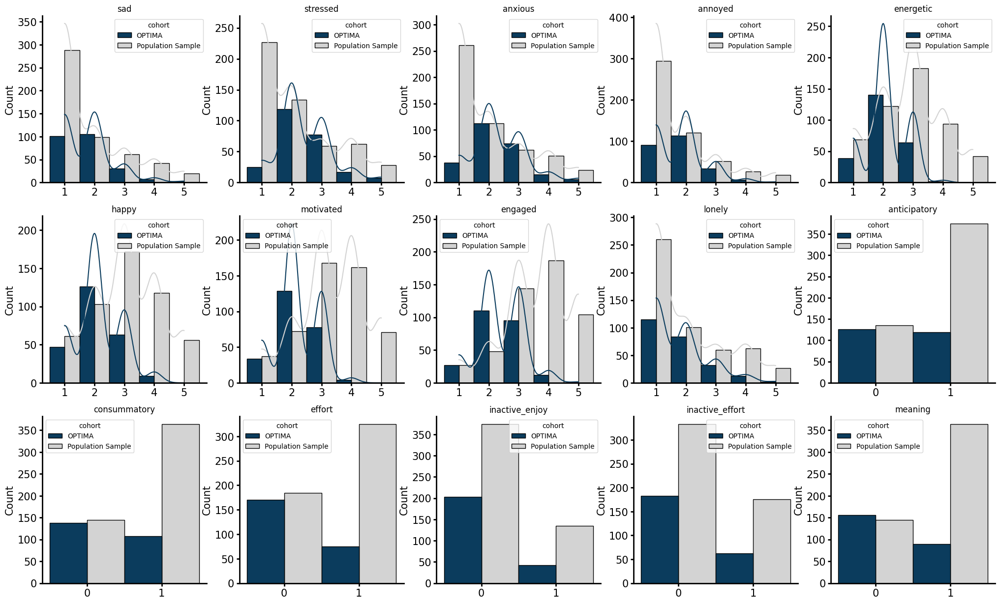

In [23]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15), sharey=False, sharex=False)
for i, outcome in enumerate(outcomes):
    ax = axes.flat[i]
    kde = True
    bins = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]
    xticks = [1, 2, 3, 4, 5]
    if ema_comp[outcome].dropna().nunique() < 4:
        kde = False
        bins = [-0.5, 0.5, 1.5]
        xticks = [0, 1]
    sns.histplot(
        data=ema_comp,
        x=outcome,
        hue="cohort",
        multiple="dodge",
        palette=[ucla_darkest_blue, "lightgray"],
        hue_order=["OPTIMA", "Population Sample"],
        bins=bins,
        ax=ax,
        alpha=1,
        kde=kde,
    )
    fa.despine_thicken_axes(ax, fontsize=15)
    ax.set_title(outcome)
    ax.set_xlabel("")
    ax.set_xticks(xticks)
ema_comp.groupby("cohort").aggregate(["min", "median", "max"]).T

# Load predictors and outcomes 

In [24]:
qc_ema.groupby("question_label").answer_id.describe()

,count,mean,std,min,25%,50%,75%,max
question_label,,,,,,,,
annoyed,23788.0,2.062595,1.092821,1.0,1.0,2.0,3.0,5.0
anticipatory,23701.0,1.534661,0.498808,1.0,1.0,2.0,2.0,2.0
anxious,23791.0,2.430877,1.134800,1.0,2.0,2.0,3.0,5.0
consummatory,23691.0,1.570892,0.494959,1.0,1.0,2.0,2.0,2.0
doing,28593.0,5.649355,2.551624,1.0,4.0,5.0,7.0,11.0
effort,23693.0,1.644410,0.478702,1.0,1.0,2.0,2.0,2.0
energetic,23783.0,2.090317,0.923306,1.0,1.0,2.0,3.0,5.0
engaged,23790.0,2.367675,0.976648,1.0,2.0,2.0,3.0,5.0
enjoying_company,13985.0,4.735145,1.697079,1.0,4.0,5.0,6.0,7.0


In [25]:
train_ema = qc_ema[qc_ema["user_id"].isin(train_users)]
test_ema = qc_ema[qc_ema["user_id"].isin(test_users)]

if USE_SUBSAMPLE:
    train_ema = train_ema.sample(n=500, random_state=42)
    test_ema = test_ema.sample(n=500, random_state=42)

train_ema.groupby("question_label").answer_id.describe()

,count,mean,std,min,25%,50%,75%,max
question_label,,,,,,,,
annoyed,18996.0,2.097547,1.108256,1.0,1.0,2.0,3.0,5.0
anticipatory,18919.0,1.533696,0.498876,1.0,1.0,2.0,2.0,2.0
anxious,18999.0,2.455392,1.160777,1.0,2.0,2.0,3.0,5.0
consummatory,18912.0,1.566995,0.495505,1.0,1.0,2.0,2.0,2.0
doing,22839.0,5.624458,2.528582,1.0,4.0,5.0,7.0,11.0
effort,18912.0,1.643190,0.479071,1.0,1.0,2.0,2.0,2.0
energetic,18992.0,2.094250,0.929376,1.0,1.0,2.0,3.0,5.0
engaged,18997.0,2.363005,0.978843,1.0,2.0,2.0,3.0,5.0
enjoying_company,11452.0,4.754890,1.701632,1.0,4.0,5.0,6.0,7.0


In [26]:
q_desc = (
    qc_ema[
        qc_ema.user_id.isin([*train_users, *test_users])
        & (qc_ema.question_label.isin(outcomes))
    ]
    .groupby("question_label")
    .answer_id.describe()
)
print(q_desc["count"].sum(), q_desc["count"].aggregate(["min", "max"]))
q_desc

356255.0 min    23687.0
max    23793.0
Name: count, dtype: float64


,count,mean,std,min,25%,50%,75%,max
question_label,,,,,,,,
annoyed,23788.0,2.062595,1.092821,1.0,1.0,2.0,3.0,5.0
anticipatory,23701.0,1.534661,0.498808,1.0,1.0,2.0,2.0,2.0
anxious,23791.0,2.430877,1.134800,1.0,2.0,2.0,3.0,5.0
consummatory,23691.0,1.570892,0.494959,1.0,1.0,2.0,2.0,2.0
effort,23693.0,1.644410,0.478702,1.0,1.0,2.0,2.0,2.0
energetic,23783.0,2.090317,0.923306,1.0,1.0,2.0,3.0,5.0
engaged,23790.0,2.367675,0.976648,1.0,2.0,2.0,3.0,5.0
happy,23787.0,2.180267,0.970753,1.0,1.0,2.0,3.0,5.0
inactive_effort,23687.0,1.624182,0.484344,1.0,1.0,2.0,2.0,2.0


In [27]:
train_ema.answer_id.dropna().shape[0], test_ema.answer_id.dropna().shape[0]

(359293, 90282)

In [28]:
today_month_year = pd.Timestamp.now().strftime("%B-%Y")
hk_fname = f"ema_hk_agg_{today_month_year}.csv"
hk_fpath = Path(cache_folder, hk_fname)
if USE_CACHE and hk_fpath.exists():
    hk_df = pd.read_csv(hk_fpath, parse_dates=["survey_start"])
else:
    hk_agg_list = Parallel(n_jobs=10, verbose=10)(
        delayed(gatherUserMetrics)(user_id, t_df, windows)
        for user_id, t_df in (
            qc_ema.loc[
                qc_ema.user_id.isin([*train_users, *test_users])
                & qc_ema.session_uuid.isin(
                    [
                        *train_ema.session_uuid.unique(),
                        *test_ema.session_uuid.unique(),
                    ]
                ),
                ["user_id", "session_start"],
            ]
            .drop_duplicates()
            .groupby("user_id")
        )
    )
    hk_df = pd.concat(hk_agg_list)
    if not USE_SUBSAMPLE:
        print(f"Writing to {hk_fpath}")
        hk_df.to_csv(hk_fpath, index=False)
hk_df.groupby("QC_expected_duration").count().T

QC_expected_duration,15Min,1h,2h,30Min,3h
audioExposure_hours,21883,23226,23382,22607,23496
audioExposure_mean,8573,17273,17811,16804,18147
audioExposure_count,21883,23226,23382,22607,23496
audioExposure_entries,21883,23226,23382,22607,23496
ActiveEnergyBurned_sum,21883,23226,23382,22607,23496
...,...,...,...,...,...
RespiratoryRate_slope,82,4860,5345,3287,5561
OxygenSaturation_intercept,0,1,2708,1,4370
OxygenSaturation_slope,0,1,2708,1,4370
HeartRateVariabilitySDNN_intercept,0,111,203,10,382


In [29]:
hk_daily = pd.read_csv(config["hk_daily_path"], parse_dates=["date"])[
    ["user_id", "date", *sleep_features]
]

In [30]:
hk_df["date"] = pd.to_datetime(hk_df["survey_start"].dt.date)
hk_w_sleep = hk_df.merge(hk_daily, how="left")

In [31]:
qc_hk = hk_w_sleep.dropna(subset=["HeartRate_mean"])
print(f"Dropping {len(hk_w_sleep) - len(qc_hk)} rows")

Dropping 9556 rows


<Axes: xlabel='count', ylabel='feature'>

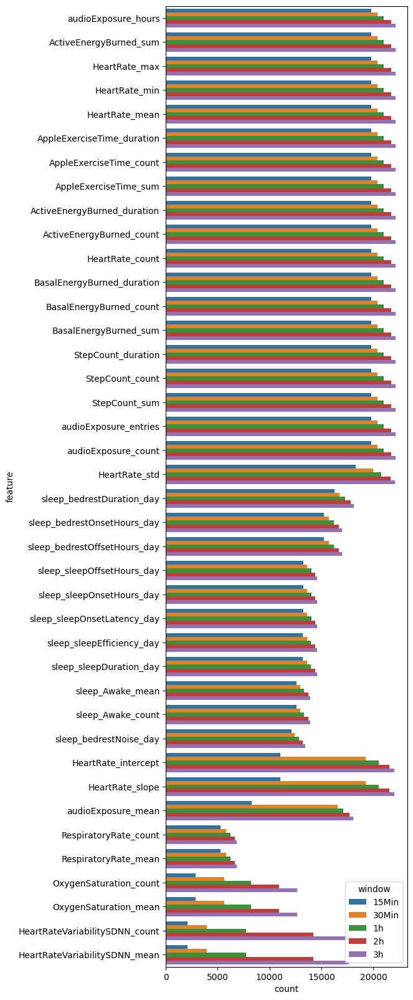

In [32]:
counts = (
    qc_hk[["QC_expected_duration", *momentary_features, *sleep_features]]
    .groupby("QC_expected_duration")
    .count()
    .T.sort_values(by="15Min", ascending=False)
    .reset_index()
    .rename(columns={"index": "feature"})
    .melt(id_vars="feature", var_name="window", value_name="count")
)
fig, ax = plt.subplots(figsize=(5, 20))
sns.barplot(data=counts, y="feature", x="count", hue="window", ax=ax, hue_order=windows)

window,15Min,30Min,1h,2h,3h
feature,,,,,
ActiveEnergyBurned_count,0.892591,0.919861,0.948621,0.981263,1.000000
HeartRate_count,0.892591,0.919861,0.948621,0.981263,1.000000
StepCount_duration,0.892591,0.919861,0.948621,0.981263,1.000000
StepCount_count,0.892591,0.919861,0.948621,0.981263,1.000000
audioExposure_entries,0.892591,0.919861,0.948621,0.981263,1.000000
ActiveEnergyBurned_duration,0.892591,0.919861,0.948621,0.981263,1.000000
audioExposure_hours,0.892591,0.919861,0.948621,0.981263,1.000000
HeartRate_min,0.892591,0.919861,0.948621,0.981263,1.000000
HeartRate_mean,0.892591,0.919861,0.948621,0.981263,1.000000


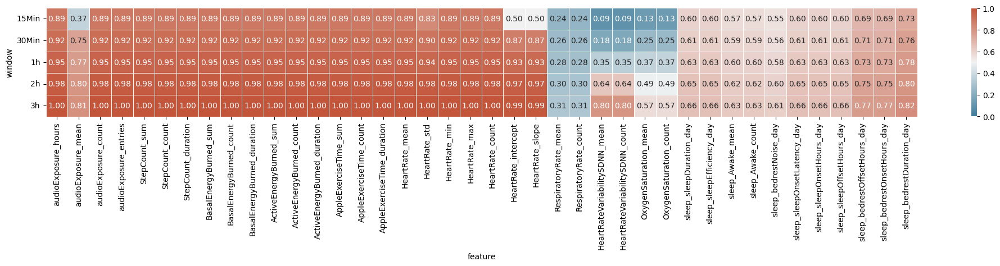

In [33]:
max_count = counts["count"].max()
perc_avail = (
    counts.pivot_table(columns="window", index="feature", values="count")[
        windows
    ].sort_values(by="15Min", ascending=False)
    / max_count
)
fig, ax = plt.subplots(figsize=(25, 5))
plots.heatmap_correlation(
    data=perc_avail.T[momentary_features + sleep_features].round(2),
    ax=ax,
    vmin=0,
    vmax=1,
    center=0.5,
)
perc_avail

# Train Model

In [34]:
train_ema_piv = (
    train_ema.loc[
        train_ema.q_id.isin(use_qids),
        [
            "user_id",
            "session_start",
            "question_label",
            "answer_id",
        ],
    ]
    .pivot_table(
        index=["user_id", "session_start"],
        columns="question_label",
        values="answer_id",
        aggfunc="first",
    )
    .reset_index()
)

In [35]:
train_ema_piv = (
    train_ema.loc[
        train_ema.q_id.isin(use_qids),
        [
            "user_id",
            "session_start",
            "question_label",
            "binary_answer",
        ],
    ]
    .pivot_table(
        index=["user_id", "session_start"],
        columns="question_label",
        values="binary_answer",
        aggfunc="first",
    )
    .reset_index()
)

In [36]:
imputer = SimpleImputer(strategy="median")
standardizer = StandardScaler()
n_internal_folds = 5
cv = StratifiedGroupKFold(n_splits=n_internal_folds, shuffle=False)

all_results = []

feature_sets = {
    "momentary_hk": momentary_features,
    "momentary_hk_sleep": momentary_features + sleep_features,
}

subusample_sufix = ""
if USE_SUBSAMPLE:
    subusample_sufix = "_subsample"


print(
    "Estimated Training Time:",
    qc_hk.QC_expected_duration.nunique()
    * len(outcomes)
    * len(feature_sets)
    * time_budget
    / 60
    / 60,
    "hours",
)

# Data Preparation
with alive_bar(
    qc_hk.QC_expected_duration.nunique() * len(outcomes) * len(feature_sets),
    force_tty=True,
) as bar:
    for feature_set_name, feature_set_cols in feature_sets.items():
        for window, window_hk in qc_hk.groupby("QC_expected_duration"):
            if USE_SUBSAMPLE:
                if window not in ["15Min", "30Min"]:
                    continue
            train_hk_ema_df = train_ema_piv.merge(
                window_hk[["user_id", "survey_start", *feature_set_cols]].rename(
                    columns={"survey_start": "session_start"}
                ),
                on=["user_id", "session_start"],
            )
            """
            # fill missing feature_setcols with median per user
            for user in train_hk_ema_df.user_id.unique():
                user_imputer = SimpleImputer(
                    strategy="median", keep_empty_features=True
                )
                user_hk = train_hk_ema_df[train_hk_ema_df.user_id == user][
                    feature_set_cols
                ]
                imputed = user_imputer.fit_transform(user_hk)
                imputed = pd.DataFrame(
                    imputed, columns=feature_set_cols, index=user_hk.index
                )
                is_all_null = user_hk.isnull().all()
                make_all_na = list(is_all_null[is_all_null].index)
                imputed[make_all_na] = np.nan
                train_hk_ema_df.loc[
                    train_hk_ema_df.user_id == user, feature_set_cols
                ] = imputed
            """
            for outcome in outcomes:
                model_file = (
                    cache_folder
                    / f"{outcome}_{window}_{feature_set_name}{subusample_sufix}.pkl"
                )
                if model_file.exists() and USE_CACHE:
                    bar()
                    continue
                use_data = train_hk_ema_df.dropna(subset=[outcome])
                # need at least n_internal_folds of each outcome value
                # for cross-validation
                if use_data[outcome].value_counts().min() <= n_internal_folds:
                    print(
                        f"Not enough data {use_data[outcome].value_counts().min()} for outcome {outcome}"
                    )
                    bar()
                    continue
                X = use_data[feature_set_cols].to_numpy()
                y = use_data[outcome].astype(int).to_numpy()
                groups = use_data["user_id"].to_numpy()

                log_file = (
                    cache_folder
                    / f"{outcome}_{window}_{feature_set_name}{subusample_sufix}.log"
                )
                auto_ml_settings = {
                    "time_budget": time_budget,
                    "metric": "roc_auc",
                    "task": "classification",
                    "n_jobs": -1,
                    "split_type": cv,
                    "early_stop": True,
                    "verbose": 0,
                    "retrain_full": True,
                    "groups": groups,
                    "log_file_name": log_file,
                    "estimator_list": estimator_list,
                }
                automl = AutoML(**auto_ml_settings)
                automl_pipeline = Pipeline(
                    [
                        ("imputer", imputer),
                        ("standardizer", standardizer),
                        ("automl", automl),
                    ]
                )
                automl_pipeline.fit(X, y, automl__groups=groups)

                with open(model_file, "wb") as f:
                    pickle.dump(automl_pipeline, f, protocol=pickle.HIGHEST_PROTOCOL)
                bar()

Estimated Training Time: 8.333333333333334 hours
|████████████████████████████████████████| 150/150 [100%] in 0.1s (1011.25/s)   


# Evaluate Performance

In [37]:
train_ema_piv = (
    train_ema.loc[
        train_ema.q_id.isin(use_qids),
        [
            "user_id",
            "session_start",
            "question_label",
            "binary_answer",
        ],
    ]
    .pivot_table(
        index=["user_id", "session_start"],
        columns="question_label",
        values="binary_answer",
        aggfunc="first",
    )
    .reset_index()
)
train_ema_piv[outcomes].count()

question_label
sad                18988
stressed           18992
anxious            18999
annoyed            18996
energetic          18992
happy              18997
motivated          18999
engaged            18997
lonely             19000
anticipatory       18919
consummatory       18912
effort             18912
inactive_enjoy     18911
inactive_effort    18906
meaning            18915
dtype: int64

In [38]:
test_ema_piv = (
    test_ema.loc[
        test_ema.q_id.isin(use_qids),
        [
            "user_id",
            "session_start",
            "question_label",
            "binary_answer",
        ],
    ]
    .pivot_table(
        index=["user_id", "session_start"],
        columns="question_label",
        values="binary_answer",
        aggfunc="first",
    )
    .reset_index()
)

In [39]:
evalulation_results = []

n_boot = 1000
samples_per_group = 100

if USE_SUBSAMPLE:
    n_boot = 10
    samples_per_group = 10

boot_dfs = []
evaluation_cache_path = Path(
    cache_folder,
    f"evaluation_results{subusample_sufix}_{today_month_year}.csv",
)
bootstrap_cache_path = Path(
    cache_folder,
    f"bootstrap_results{subusample_sufix}_{today_month_year}.csv",
)

if USE_CACHE and evaluation_cache_path.exists() and bootstrap_cache_path.exists():
    print("Loading from cache")
    evaluation_df = pd.read_csv(evaluation_cache_path)
    bootstrap_df = pd.read_csv(bootstrap_cache_path)
else:
    with alive_bar(
        qc_hk.QC_expected_duration.nunique() * len(outcomes) * len(feature_sets),
        force_tty=True,
    ) as bar:
        for feature_set_name, feature_set_cols in feature_sets.items():
            for outcome in outcomes:
                for window, window_hk in qc_hk.groupby("QC_expected_duration"):
                    test_hk_ema_df = test_ema_piv.merge(
                        window_hk[
                            ["user_id", "survey_start", *feature_set_cols]
                        ].rename(columns={"survey_start": "session_start"}),
                        on=["user_id", "session_start"],
                    )
                    """
                    # fill missing feature_setcols with median per user
                    for user in test_hk_ema_df.user_id.unique():
                        user_imputer = SimpleImputer(
                            strategy="median", keep_empty_features=True
                        )
                        user_hk = test_hk_ema_df[train_hk_ema_df.user_id == user][
                            feature_set_cols
                        ]
                        if user_hk.empty:
                            print(user, window, outcome, "no data")
                            continue
                        imputed = user_imputer.fit_transform(user_hk)
                        imputed = pd.DataFrame(
                            imputed, columns=feature_set_cols, index=user_hk.index
                        )
                        is_all_null = user_hk.isnull().all()
                        make_all_na = list(is_all_null[is_all_null].index)
                        imputed[make_all_na] = np.nan
                        test_hk_ema_df.loc[
                            train_hk_ema_df.user_id == user, feature_set_cols
                        ] = imputed
                    """

                    model_file = (
                        cache_folder
                        / f"{outcome}_{window}_{feature_set_name}{subusample_sufix}.pkl"
                    )
                    if not model_file.exists():
                        continue
                    log_file = (
                        cache_folder
                        / f"{outcome}_{window}_{feature_set_name}{subusample_sufix}.log"
                    )

                    with open(model_file, "rb") as f:
                        automl_pipeline = pickle.load(f)

                    # get validation loss for each model from log file
                    (
                        time_history,
                        best_valid_loss_history,
                        valid_loss_history,
                        config_history,
                        metric_history,
                    ) = get_output_from_log(filename=log_file, time_budget=time_budget)

                    X = test_hk_ema_df.dropna(subset=[outcome])[
                        feature_set_cols
                    ].to_numpy()
                    y = (
                        test_hk_ema_df.dropna(subset=[outcome])[outcome]
                        .astype(int)
                        .to_numpy()
                    )

                    pred_proba = automl_pipeline.predict_proba(X)[:, 1]
                    pred = automl_pipeline.predict(X)

                    # Calculate ROC AUC bootstrap confidence interval
                    cp = test_hk_ema_df.dropna(subset=[outcome]).copy()
                    cp["pred_proba"] = pred_proba
                    resBoot = bootstrapPerformance(
                        cp,
                        unit="user_id",
                        n_boot=n_boot,
                        samples_per_group=samples_per_group,
                        random_state=42,
                        pred_col="pred_proba",
                        true_col=outcome,
                    )
                    resBoot["outcome"] = outcome
                    resBoot["window"] = window
                    resBoot["model"] = config_history[
                        np.argmin(best_valid_loss_history)
                    ]["Best Learner"]
                    resBoot["feature_set"] = feature_set_name
                    boot_dfs.append(resBoot)

                    res = pd.DataFrame(
                        {
                            "pred_proba": pred_proba,
                            "pred": pred,
                            "actual": y,
                            "session_start": test_hk_ema_df.dropna(
                                subset=[outcome]
                            ).session_start,
                            "user_id": cp.user_id,
                        }
                    )
                    res["outcome"] = outcome
                    res["model"] = config_history[np.argmin(best_valid_loss_history)][
                        "Best Learner"
                    ]
                    res["window"] = window
                    res["feature_set"] = feature_set_name
                    res["validation_roc_auc"] = (
                        1 - np.array(best_valid_loss_history)[-1]
                    )
                    res["test_roc_auc"] = resBoot["auroc"].mean()
                    res["test_size"] = y.shape[0]
                    res["test_users"] = test_hk_ema_df.dropna(
                        subset=[outcome]
                    ).user_id.nunique()

                    evalulation_results.append(res)
                    bar()

    evaluation_df = pd.concat(evalulation_results)
    bootstrap_df = pd.concat(boot_dfs)
    evaluation_df.to_csv(evaluation_cache_path, index=False)
    bootstrap_df.to_csv(bootstrap_cache_path, index=False)

Loading from cache


In [40]:
from scipy import stats

test_res_list = []
for (feature_set_name, window, outcome, model), df in bootstrap_df.groupby(
    ["feature_set", "window", "outcome", "model"]
):
    # test if the ROC AUC is significantly > 0.5
    test_res = pg.wilcoxon(
        df.auroc.astype(float),
        np.array([0.5] * df.shape[0]),
        alternative="greater",
    )
    scipy_res = stats.wilcoxon(df.auroc.astype(float) - 0.5, alternative="greater")
    test_res["feature_set"] = feature_set_name
    test_res["model"] = model
    test_res["window"] = window
    test_res["outcome"] = outcome
    test_res["scipy_p"] = scipy_res.pvalue
    test_res["mean_auroc"] = df.auroc.median()
    test_res["n"] = df.shape[0]
    test_res["auroc_ci"] = (
        f"{df.auroc.quantile(0.025).round(3)}, {df.auroc.quantile(0.975).round(3)}"
    )
    test_res_list.append(test_res)

test_res_df = pd.concat(test_res_list)

test_res_df["p-corr"] = pg.multicomp(
    # test_res_df["p-val"].astype(float), method="bonf"
    test_res_df["scipy_p"].astype(float),
    method="bonf",
)[1]
test_res_df.sort_values(by="p-corr")

,W-val,alternative,p-val,RBC,CLES,feature_set,model,window,outcome,scipy_p,mean_auroc,n,auroc_ci,p-corr
Wilcoxon,500500.0,greater,1.665428e-165,1.000000,1.000,momentary_hk,lgbm,15Min,annoyed,1.662930e-165,0.534701,1000,"0.518, 0.55",2.494394e-163
Wilcoxon,500500.0,greater,1.665428e-165,1.000000,1.000,momentary_hk_sleep,lgbm,1h,stressed,1.662930e-165,0.554164,1000,"0.535, 0.571",2.494394e-163
Wilcoxon,500500.0,greater,1.665428e-165,1.000000,1.000,momentary_hk_sleep,rf,1h,motivated,1.662930e-165,0.566905,1000,"0.55, 0.584",2.494394e-163
Wilcoxon,500500.0,greater,1.665428e-165,1.000000,1.000,momentary_hk_sleep,rf,1h,inactive_effort,1.662930e-165,0.542145,1000,"0.527, 0.557",2.494394e-163
Wilcoxon,500500.0,greater,1.665428e-165,1.000000,1.000,momentary_hk_sleep,rf,1h,energetic,1.662930e-165,0.540285,1000,"0.524, 0.557",2.494394e-163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wilcoxon,2.0,greater,1.000000e+00,-0.999992,0.001,momentary_hk,xgboost,1h,happy,1.000000e+00,0.474529,1000,"0.458, 0.49",1.000000e+00
Wilcoxon,0.0,greater,1.000000e+00,-1.000000,0.000,momentary_hk,rf,1h,engaged,1.000000e+00,0.455419,1000,"0.435, 0.474",1.000000e+00
Wilcoxon,31377.0,greater,1.000000e+00,-0.874617,0.151,momentary_hk_sleep,xgboost,2h,happy,1.000000e+00,0.490008,1000,"0.472, 0.507",1.000000e+00
Wilcoxon,3.0,greater,1.000000e+00,-0.999988,0.001,momentary_hk_sleep,xgboost,15Min,lonely,1.000000e+00,0.477064,1000,"0.463, 0.492",1.000000e+00


,outcome,window_minutes
0,sad,180.0
1,stressed,60.0
2,anxious,120.0
3,annoyed,120.0
4,energetic,180.0
5,happy,30.0
6,motivated,180.0
7,engaged,180.0
8,lonely,120.0
9,anticipatory,120.0


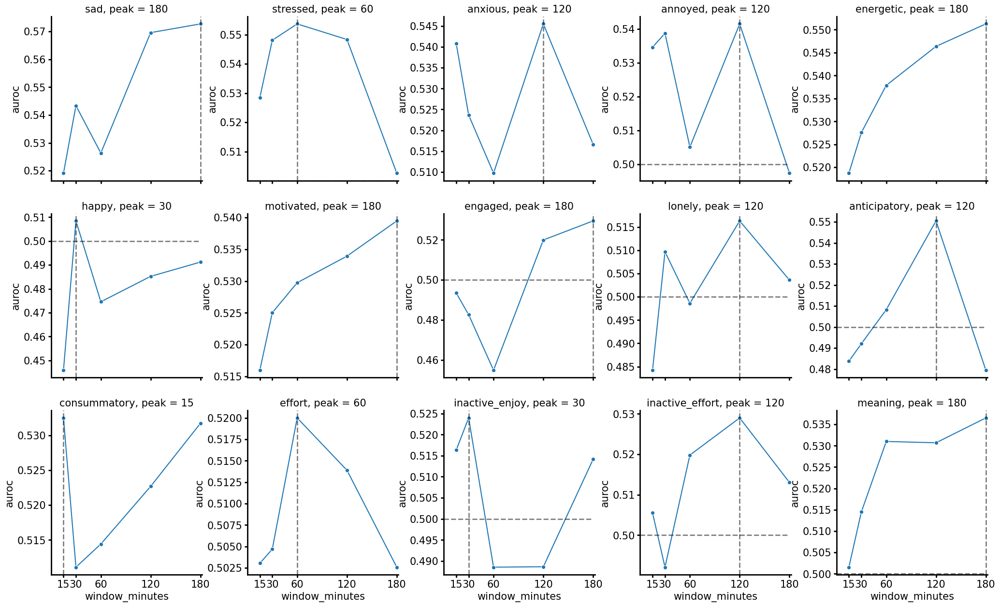

In [41]:
bootstrap_df["window_minutes"] = (
    pd.to_timedelta(bootstrap_df["window"]).dt.total_seconds() / 60
)
peak_dict = {
    "outcome": [],
    "window_minutes": [],
}
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15), sharey=False, sharex=True)
plt.subplots_adjust(wspace=0.3)
for i, outcome in enumerate(outcomes):
    ax = axes.flat[i]
    sns.lineplot(
        data=bootstrap_df[
            (bootstrap_df.feature_set == "momentary_hk")
            & (bootstrap_df.outcome == outcome)
        ],
        x="window_minutes",
        y="auroc",
        marker="o",
        ax=ax,
        errorbar=None,
    )
    peak = (
        bootstrap_df[
            (bootstrap_df.feature_set == "momentary_hk")
            & (bootstrap_df.outcome == outcome)
        ]
        .groupby("window_minutes")
        .auroc.median()
    )
    peak = peak.index[peak.argmax()]

    peak_dict["outcome"].append(outcome)
    peak_dict["window_minutes"].append(peak)

    ylims = ax.get_ylim()
    ax.vlines(peak, *ylims, color="k", linestyles="dashed", linewidth=2, alpha=0.5)
    ax.set_ylim(ylims)
    ax.hlines(0.5, 0, 180, color="k", linestyles="dashed", linewidth=2, alpha=0.5)
    ax.set_xlim(0, 182)
    ax.set_title(f"{outcome}, peak = {peak:.0f}", fontsize=15)
    ax.set_xticks([15, 30, 60, 120, 180])
    fa.despine_thicken_axes(ax, fontsize=15)

peak_df = pd.DataFrame(peak_dict)
peak_df

In [42]:
bootstrap_df["window_minutes"] = (
    pd.to_timedelta(bootstrap_df["window"]).dt.total_seconds() / 60
).astype(int)
peak_window_dict = {
    "outcome": [],
    "window_minutes": [],
}
for i, outcome in enumerate(outcomes):
    use_boot_df = bootstrap_df[
        (bootstrap_df.outcome == outcome) & (bootstrap_df.feature_set == "momentary_hk")
    ]
    peak = use_boot_df.groupby("window_minutes").auroc.median()
    peak = peak.index[peak.argmax()]

    peak_window_dict["outcome"].append(outcome)
    peak_window_dict["window_minutes"].append(peak)
peak_window_df = pd.DataFrame(peak_window_dict)


peak_window_df

,outcome,window_minutes
0,sad,180
1,stressed,60
2,anxious,120
3,annoyed,120
4,energetic,180
5,happy,30
6,motivated,180
7,engaged,180
8,lonely,120
9,anticipatory,120


In [43]:
bootstrap_df["window_minutes"] = (
    pd.to_timedelta(bootstrap_df["window"]).dt.total_seconds() / 60
)
peak_feat_dict = {
    "outcome": [],
    "feature_set": [],
}
for i, outcome in enumerate(outcomes):
    use_boot_df = bootstrap_df[
        (bootstrap_df.outcome == outcome)
        & (
            bootstrap_df.window_minutes
            == peak_window_df[peak_window_df.outcome == outcome].window_minutes.iloc[0]
        )
    ]
    peak = use_boot_df.groupby("feature_set").auroc.median()
    peak = peak.index[peak.argmax()]

    peak_feat_dict["outcome"].append(outcome)
    peak_feat_dict["feature_set"].append(peak)
peak_feat_df = pd.DataFrame(peak_feat_dict)


peak_feat_df

,outcome,feature_set
0,sad,momentary_hk
1,stressed,momentary_hk_sleep
2,anxious,momentary_hk
3,annoyed,momentary_hk
4,energetic,momentary_hk_sleep
5,happy,momentary_hk
6,motivated,momentary_hk_sleep
7,engaged,momentary_hk_sleep
8,lonely,momentary_hk
9,anticipatory,momentary_hk


In [44]:
bf_alpha = 0.05 / (len(outcomes) * len(feature_sets) * len(windows))

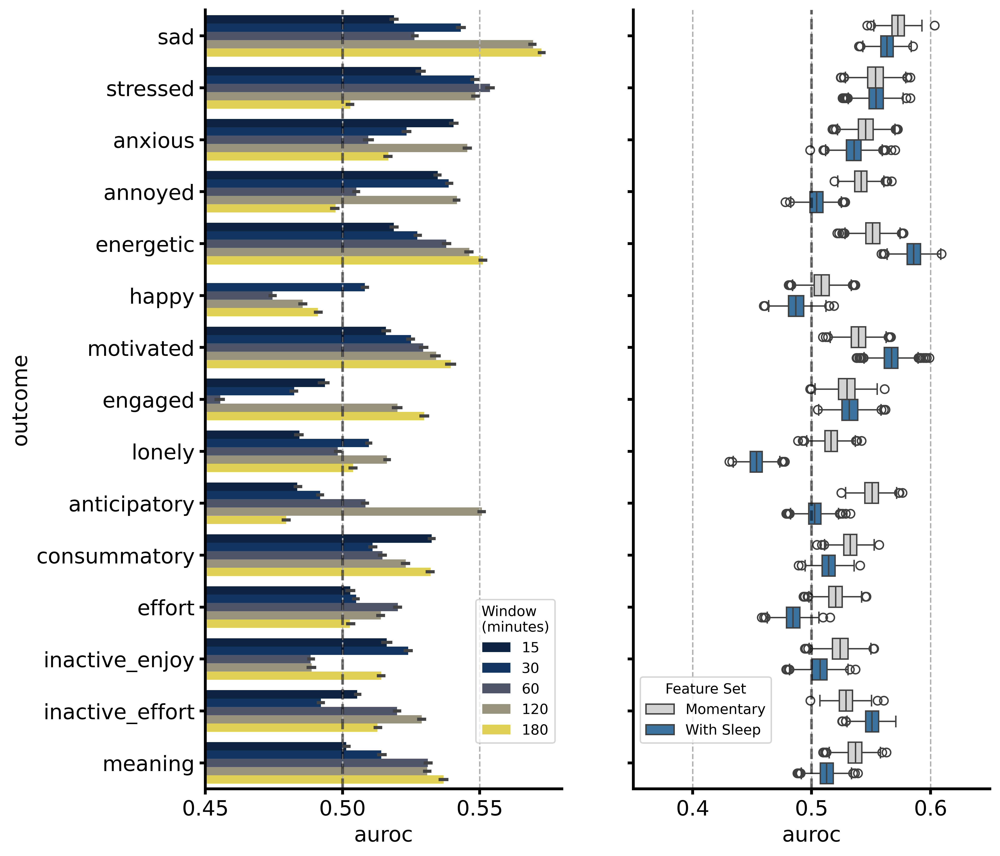

In [45]:
bootstrap_df["window_minutes"] = bootstrap_df["window_minutes"].astype(int)
peak_window_df["window_minutes"] = peak_window_df["window_minutes"].astype(int)

fig, axes = plt.subplots(figsize=(10, 10), ncols=2, sharey=True, dpi=500)
ax = axes[0]
sns.barplot(
    data=bootstrap_df[bootstrap_df.feature_set == "momentary_hk"],
    x="auroc",
    y="outcome",
    hue="window_minutes",
    estimator="median",
    order=outcomes,
    palette="cividis",
    saturation=0.7,
    errorbar=("ci", 100 * (1 - bf_alpha)),
    ax=ax,
)
ylim = ax.get_ylim()
ax.vlines(0.5, *ylim, color="k", linestyles="dashed", linewidth=2, alpha=0.5)
ax.set_ylim(ylim)
ax.set_xlim(0.45, 0.58)
fa.despine_thicken_axes(ax, fontsize=15)
ax.grid(linestyle="--", lw=1, axis="x")
ax.legend(
    bbox_to_anchor=(1, 0.05),
    loc="lower right",
    ncol=1,
    title="Window\n(minutes)",
)

ax = axes[1]
bootstrap_df["Features"] = bootstrap_df["feature_set"].map(feature_set_name_map)
sns.boxplot(
    data=bootstrap_df.merge(peak_window_df),
    x="auroc",
    y="outcome",
    hue="Features",
    order=outcomes,
    palette=["lightgray", styles["ucla_blue"]],
    ax=ax,
)
ylim = ax.get_ylim()
ax.vlines(0.5, *ylim, color="k", linestyles="dashed", linewidth=2, alpha=0.5)
ax.set_ylim(ylim)
ax.set_xlim(0.35, 0.65)
fa.despine_thicken_axes(ax, fontsize=15)
ax.grid(linestyle="--", lw=1, axis="x")
ax.legend(bbox_to_anchor=(0, 0.05), loc="lower left", ncol=1, title="Feature Set")

In [46]:
n_comp = len(outcomes) * len(windows) * len(feature_sets)
print(n_comp)
result_summary = {
    "outcome": [],
    "window": [],
    "model": [],
    "feature_set": [],
    "median_auroc": [],
    "lower_auroc": [],
    "upper_auroc": [],
    "bf_alpha": [],
    "train_n": [],
    "test_n": [],
}
for outcome in outcomes:
    for window in windows:
        for feature_set_name, feature_set_cols in feature_sets.items():
            train_hk_ema_df = train_ema_piv.merge(
                window_hk[["user_id", "survey_start", *feature_set_cols]].rename(
                    columns={"survey_start": "session_start"}
                ),
                on=["user_id", "session_start"],
            ).dropna(subset=[outcome])
            test_hk_ema_df = test_ema_piv.merge(
                window_hk[["user_id", "survey_start", *feature_set_cols]].rename(
                    columns={"survey_start": "session_start"}
                ),
                on=["user_id", "session_start"],
            ).dropna(subset=[outcome])
            use_boot_df = bootstrap_df[
                (bootstrap_df.outcome == outcome)
                & (bootstrap_df.window == window)
                & (bootstrap_df.feature_set == feature_set_name)
            ]
            model_name = use_boot_df.model.unique()[0]
            median_auroc = use_boot_df.auroc.median()
            bf_alpha = 0.05 / n_comp
            lower_percentile = bf_alpha / 2
            upper_percentile = 1 - (bf_alpha / 2)
            lower_auroc = use_boot_df.auroc.quantile(lower_percentile)
            upper_auroc = use_boot_df.auroc.quantile(upper_percentile)
            train_n = len(train_hk_ema_df)
            test_n = len(test_hk_ema_df)

            result_summary["outcome"].append(outcome)
            result_summary["window"].append(window)
            result_summary["model"].append(model_name)
            result_summary["feature_set"].append(feature_set_name)
            result_summary["median_auroc"].append(median_auroc)
            result_summary["lower_auroc"].append(lower_auroc)
            result_summary["upper_auroc"].append(upper_auroc)
            result_summary["bf_alpha"].append(bf_alpha)
            result_summary["train_n"].append(train_n)
            result_summary["test_n"].append(test_n)
            if (median_auroc > upper_auroc) or (median_auroc < lower_auroc):
                print(outcome, window, feature_set_name, median_auroc)

result_summary_df = pd.DataFrame(result_summary)
result_summary_df["auroc_str"] = result_summary_df.apply(
    lambda x: f"{x['median_auroc']:.3f} ({x['lower_auroc']:.3f}, {x['upper_auroc']:.3f})",
    axis=1,
)
result_summary_df

150


,outcome,window,model,feature_set,median_auroc,lower_auroc,upper_auroc,bf_alpha,train_n,test_n,auroc_str
0,sad,15Min,xgboost,momentary_hk,0.518796,0.491990,0.544541,0.000333,17707,4412,"0.519 (0.492, 0.545)"
1,sad,15Min,xgboost,momentary_hk_sleep,0.531727,0.507996,0.555882,0.000333,17707,4412,"0.532 (0.508, 0.556)"
2,sad,30Min,lgbm,momentary_hk,0.543144,0.520258,0.565122,0.000333,17707,4412,"0.543 (0.520, 0.565)"
3,sad,30Min,lrl2,momentary_hk_sleep,0.570227,0.547342,0.596487,0.000333,17707,4412,"0.570 (0.547, 0.596)"
4,sad,1h,xgboost,momentary_hk,0.526229,0.498450,0.549292,0.000333,17707,4412,"0.526 (0.498, 0.549)"
...,...,...,...,...,...,...,...,...,...,...,...
145,meaning,1h,rf,momentary_hk_sleep,0.492790,0.470230,0.524560,0.000333,17640,4403,"0.493 (0.470, 0.525)"
146,meaning,2h,xgboost,momentary_hk,0.530888,0.503748,0.557953,0.000333,17640,4403,"0.531 (0.504, 0.558)"
147,meaning,2h,xgboost,momentary_hk_sleep,0.531717,0.508827,0.557914,0.000333,17640,4403,"0.532 (0.509, 0.558)"
148,meaning,3h,xgboost,momentary_hk,0.536866,0.509746,0.562380,0.000333,17640,4403,"0.537 (0.510, 0.562)"


In [47]:
bf_alpha, lower_percentile, upper_percentile

(0.0003333333333333334, 0.0001666666666666667, 0.9998333333333334)

In [48]:
result_summary_df[result_summary_df.outcome == "meaning"]

,outcome,window,model,feature_set,median_auroc,lower_auroc,upper_auroc,bf_alpha,train_n,test_n,auroc_str
140,meaning,15Min,lgbm,momentary_hk,0.501377,0.478395,0.524934,0.000333,17640,4403,"0.501 (0.478, 0.525)"
141,meaning,15Min,rf,momentary_hk_sleep,0.500324,0.471562,0.526760,0.000333,17640,4403,"0.500 (0.472, 0.527)"
142,meaning,30Min,xgboost,momentary_hk,0.514116,0.492161,0.547780,0.000333,17640,4403,"0.514 (0.492, 0.548)"
143,meaning,30Min,rf,momentary_hk_sleep,0.511454,0.486528,0.539180,0.000333,17640,4403,"0.511 (0.487, 0.539)"
144,meaning,1h,xgboost,momentary_hk,0.531132,0.502326,0.558117,0.000333,17640,4403,"0.531 (0.502, 0.558)"
145,meaning,1h,rf,momentary_hk_sleep,0.492790,0.470230,0.524560,0.000333,17640,4403,"0.493 (0.470, 0.525)"
146,meaning,2h,xgboost,momentary_hk,0.530888,0.503748,0.557953,0.000333,17640,4403,"0.531 (0.504, 0.558)"
147,meaning,2h,xgboost,momentary_hk_sleep,0.531717,0.508827,0.557914,0.000333,17640,4403,"0.532 (0.509, 0.558)"
148,meaning,3h,xgboost,momentary_hk,0.536866,0.509746,0.562380,0.000333,17640,4403,"0.537 (0.510, 0.562)"
149,meaning,3h,lgbm,momentary_hk_sleep,0.512532,0.488069,0.538528,0.000333,17640,4403,"0.513 (0.488, 0.539)"


In [49]:
peak_param_list = []
for outcome in outcomes:
    outcome_res = result_summary_df[result_summary_df.outcome == outcome]
    if not outcome_res[outcome_res.lower_auroc > 0.5].empty:
        peak_param_list.append(
            outcome_res[outcome_res.lower_auroc > 0.5]
            .sort_values(by="median_auroc", ascending=False)
            .iloc[0]
        )
    else:
        peak_param_list.append(
            outcome_res.sort_values(by="median_auroc", ascending=False).iloc[0]
        )
peak_param_df = pd.DataFrame(peak_param_list)
peak_param_df

,outcome,window,model,feature_set,median_auroc,lower_auroc,upper_auroc,bf_alpha,train_n,test_n,auroc_str
8,sad,3h,xgboost,momentary_hk,0.572547,0.547349,0.601692,0.000333,17707,4412,"0.573 (0.547, 0.602)"
15,stressed,1h,lgbm,momentary_hk_sleep,0.554164,0.526173,0.582471,0.000333,17712,4413,"0.554 (0.526, 0.582)"
26,anxious,2h,rf,momentary_hk,0.545467,0.517636,0.572425,0.000333,17719,4412,"0.545 (0.518, 0.572)"
36,annoyed,2h,lgbm,momentary_hk,0.541717,0.519564,0.566773,0.000333,17715,4412,"0.542 (0.520, 0.567)"
49,energetic,3h,rf,momentary_hk_sleep,0.585793,0.559009,0.609174,0.000333,17713,4411,"0.586 (0.559, 0.609)"
52,happy,30Min,lgbm,momentary_hk,0.508162,0.480722,0.536529,0.000333,17719,4410,"0.508 (0.481, 0.537)"
69,motivated,3h,rf,momentary_hk_sleep,0.567154,0.537800,0.598696,0.000333,17718,4413,"0.567 (0.538, 0.599)"
77,engaged,2h,xgboost,momentary_hk_sleep,0.543925,0.508264,0.577916,0.000333,17717,4413,"0.544 (0.508, 0.578)"
86,lonely,2h,lgbm,momentary_hk,0.516226,0.489127,0.541356,0.000333,17719,4412,"0.516 (0.489, 0.541)"
96,anticipatory,2h,rf,momentary_hk,0.550779,0.525576,0.576047,0.000333,17647,4402,"0.551 (0.526, 0.576)"


In [50]:
peak_param_df["feature_set-window"] = (
    peak_param_df["feature_set"] + " " + peak_param_df["window"]
)
peak_param_result_table = peak_param_df.copy().merge(
    test_res_df[["outcome", "feature_set", "window", "model", "p-corr"]]
)
peak_param_result_table["Features"] = peak_param_result_table["feature_set"].map(
    feature_set_name_map
)
peak_param_result_table["Feature Set"] = (
    peak_param_result_table["Features"] + " " + peak_param_result_table["window"]
)

peak_param_result_table["Model"] = peak_param_result_table["model"].map(model_name_map)

peak_param_result_table = peak_param_result_table[
    [
        "outcome",
        "Feature Set",
        "Model",
        "auroc_str",
        "train_n",
        "test_n",
    ]
]
peak_param_result_table.columns = [
    "EMA Item",
    "Feature Set",
    "Model",
    "AUROC (95% CI)",
    "Train N",
    "Test N",
]
peak_param_result_table.to_clipboard(index=False)
peak_param_result_table

,EMA Item,Feature Set,Model,AUROC (95% CI),Train N,Test N
0,sad,Momentary 3h,XGBoost,"0.573 (0.547, 0.602)",17707,4412
1,stressed,With Sleep 1h,LightGBM,"0.554 (0.526, 0.582)",17712,4413
2,anxious,Momentary 2h,Random Forest,"0.545 (0.518, 0.572)",17719,4412
3,annoyed,Momentary 2h,LightGBM,"0.542 (0.520, 0.567)",17715,4412
4,energetic,With Sleep 3h,Random Forest,"0.586 (0.559, 0.609)",17713,4411
5,happy,Momentary 30Min,LightGBM,"0.508 (0.481, 0.537)",17719,4410
6,motivated,With Sleep 3h,Random Forest,"0.567 (0.538, 0.599)",17718,4413
7,engaged,With Sleep 2h,XGBoost,"0.544 (0.508, 0.578)",17717,4413
8,lonely,Momentary 2h,LightGBM,"0.516 (0.489, 0.541)",17719,4412
9,anticipatory,Momentary 2h,Random Forest,"0.551 (0.526, 0.576)",17647,4402


In [51]:
sig_outcomes = result_summary_df[result_summary_df.lower_auroc > 0.5].outcome.unique()
result_summary_df[result_summary_df.lower_auroc > 0.5]

,outcome,window,model,feature_set,median_auroc,lower_auroc,upper_auroc,bf_alpha,train_n,test_n,auroc_str
1,sad,15Min,xgboost,momentary_hk_sleep,0.531727,0.507996,0.555882,0.000333,17707,4412,"0.532 (0.508, 0.556)"
2,sad,30Min,lgbm,momentary_hk,0.543144,0.520258,0.565122,0.000333,17707,4412,"0.543 (0.520, 0.565)"
3,sad,30Min,lrl2,momentary_hk_sleep,0.570227,0.547342,0.596487,0.000333,17707,4412,"0.570 (0.547, 0.596)"
6,sad,2h,xgboost,momentary_hk,0.569510,0.544319,0.592642,0.000333,17707,4412,"0.570 (0.544, 0.593)"
7,sad,2h,xgboost,momentary_hk_sleep,0.551426,0.530521,0.572062,0.000333,17707,4412,"0.551 (0.531, 0.572)"
...,...,...,...,...,...,...,...,...,...,...,...
139,inactive_effort,3h,rf,momentary_hk_sleep,0.536706,0.515780,0.560537,0.000333,17633,4401,"0.537 (0.516, 0.561)"
144,meaning,1h,xgboost,momentary_hk,0.531132,0.502326,0.558117,0.000333,17640,4403,"0.531 (0.502, 0.558)"
146,meaning,2h,xgboost,momentary_hk,0.530888,0.503748,0.557953,0.000333,17640,4403,"0.531 (0.504, 0.558)"
147,meaning,2h,xgboost,momentary_hk_sleep,0.531717,0.508827,0.557914,0.000333,17640,4403,"0.532 (0.509, 0.558)"


In [52]:
result_summary_df["Features"] = result_summary_df["feature_set"].map(
    feature_set_name_map
)

ordering = [
    (f"{feature_set_name_map[feature_set_name]}", f"{window}")
    for feature_set_name, feature_set_cols in feature_sets.items()
    for window in windows
]
result_summary_table = result_summary_df.pivot_table(
    index=["Features", "window"],
    columns="outcome",
    values="auroc_str",
    aggfunc="first",
).reindex(ordering)[outcomes]

result_summary_table.to_clipboard(excel=True)

result_summary_table

outcome                             sad              stressed  \
Features   window                                               
Momentary  15Min   0.519 (0.492, 0.545)  0.529 (0.495, 0.558)   
           30Min   0.543 (0.520, 0.565)  0.548 (0.518, 0.577)   
           1h      0.526 (0.498, 0.549)  0.554 (0.525, 0.583)   
           2h      0.570 (0.544, 0.593)  0.548 (0.522, 0.575)   
           3h      0.573 (0.547, 0.602)  0.503 (0.476, 0.528)   
With Sleep 15Min   0.532 (0.508, 0.556)  0.544 (0.513, 0.574)   
           30Min   0.570 (0.547, 0.596)  0.546 (0.519, 0.572)   
           1h      0.516 (0.488, 0.541)  0.554 (0.526, 0.582)   
           2h      0.551 (0.531, 0.572)  0.554 (0.525, 0.579)   
           3h      0.563 (0.540, 0.585)  0.535 (0.507, 0.566)   

outcome                         anxious               annoyed  \
Features   window                                               
Momentary  15Min   0.540 (0.508, 0.569)  0.535 (0.505, 0.561)   
           30Min   0.523 (0.494, 0.556)  0.539 (0.517, 0.562)   
           1h      0.509 (0.477, 0.541)  0.505 (0.481, 0.527)   
           2h      0.545 (0.518, 0.572)  0.542 (0.520, 0.567)   
           3h      0.517 (0.486, 0.548)  0.497 (0.472, 0.525)   
With Sleep 15Min   0.530 (0.501, 0.562)  0.497 (0.475, 0.520)   
           30Min   0.527 (0.500, 0.566)  0.509 (0.488, 0.533)   
           1h      0.520 (0.491, 0.544)  0.518 (0.496, 0.548)   
           2h      0.536 (0.501, 0.570)  0.504 (0.479, 0.528)   
           3h      0.491 (0.464, 0.521)  0.526 (0.501, 0.551)   

outcome                       energetic                 happy  \
Features   window                                               
Momentary  15Min   0.519 (0.494, 0.545)  0.446 (0.419, 0.473)   
           30Min   0.527 (0.501, 0.552)  0.508 (0.481, 0.537)   
           1h      0.538 (0.514, 0.566)  0.475 (0.453, 0.502)   
           2h      0.546 (0.520, 0.569)  0.485 (0.453, 0.510)   
           3h      0.551 (0.522, 0.577)  0.491 (0.467, 0.521)   
With Sleep 15Min   0.552 (0.528, 0.580)  0.446 (0.413, 0.475)   
           30Min   0.552 (0.528, 0.577)  0.487 (0.460, 0.518)   
           1h      0.540 (0.513, 0.565)  0.481 (0.451, 0.508)   
           2h      0.568 (0.544, 0.594)  0.490 (0.459, 0.519)   
           3h      0.586 (0.559, 0.609)  0.471 (0.438, 0.499)   

outcome                       motivated               engaged  \
Features   window                                               
Momentary  15Min   0.516 (0.482, 0.547)  0.494 (0.461, 0.523)   
           30Min   0.525 (0.492, 0.557)  0.482 (0.451, 0.511)   
           1h      0.529 (0.503, 0.566)  0.455 (0.422, 0.484)   
           2h      0.534 (0.509, 0.562)  0.520 (0.485, 0.552)   
           3h      0.539 (0.510, 0.566)  0.530 (0.499, 0.560)   
With Sleep 15Min   0.534 (0.502, 0.566)  0.532 (0.499, 0.560)   
           30Min   0.557 (0.530, 0.587)  0.540 (0.508, 0.573)   
           1h      0.567 (0.541, 0.595)  0.504 (0.471, 0.533)   
           2h      0.564 (0.533, 0.600)  0.544 (0.508, 0.578)   
           3h      0.567 (0.538, 0.599)  0.532 (0.505, 0.562)   

outcome                          lonely          anticipatory  \
Features   window                                               
Momentary  15Min   0.484 (0.460, 0.509)  0.483 (0.453, 0.508)   
           30Min   0.510 (0.487, 0.534)  0.492 (0.465, 0.518)   
           1h      0.498 (0.473, 0.523)  0.508 (0.485, 0.534)   
           2h      0.516 (0.489, 0.541)  0.551 (0.526, 0.576)   
           3h      0.504 (0.481, 0.525)  0.479 (0.456, 0.505)   
With Sleep 15Min   0.477 (0.451, 0.500)  0.513 (0.490, 0.536)   
           30Min   0.473 (0.450, 0.494)  0.519 (0.495, 0.542)   
           1h      0.508 (0.480, 0.533)  0.539 (0.513, 0.564)   
           2h      0.454 (0.431, 0.477)  0.503 (0.479, 0.532)   
           3h      0.504 (0.476, 0.524)  0.509 (0.487, 0.538)   

outcome                    consummatory                effort  \
Features   window             

In [53]:
result_summary_df["ci_short"] = (
    result_summary_df["lower_auroc"].round(2).astype(str)
    + ", "
    + result_summary_df["upper_auroc"].round(2).astype(str)
)

result_summary_table_ci = result_summary_df.pivot_table(
    index=["Features", "window"],
    columns="outcome",
    values="ci_short",
    aggfunc="first",
).reindex(ordering)[outcomes]

result_summary_table_ci

outcome                   sad    stressed     anxious     annoyed   energetic  \
Features   window                                                               
Momentary  15Min   0.49, 0.54   0.5, 0.56  0.51, 0.57  0.51, 0.56  0.49, 0.55   
           30Min   0.52, 0.57  0.52, 0.58  0.49, 0.56  0.52, 0.56   0.5, 0.55   
           1h       0.5, 0.55  0.52, 0.58  0.48, 0.54  0.48, 0.53  0.51, 0.57   
           2h      0.54, 0.59  0.52, 0.58  0.52, 0.57  0.52, 0.57  0.52, 0.57   
           3h       0.55, 0.6  0.48, 0.53  0.49, 0.55  0.47, 0.53  0.52, 0.58   
With Sleep 15Min   0.51, 0.56  0.51, 0.57   0.5, 0.56  0.47, 0.52  0.53, 0.58   
           30Min    0.55, 0.6  0.52, 0.57   0.5, 0.57  0.49, 0.53  0.53, 0.58   
           1h      0.49, 0.54  0.53, 0.58  0.49, 0.54   0.5, 0.55  0.51, 0.57   
           2h      0.53, 0.57  0.52, 0.58   0.5, 0.57  0.48, 0.53  0.54, 0.59   
           3h      0.54, 0.59  0.51, 0.57  0.46, 0.52   0.5, 0.55  0.56, 0.61   

outcome                 happy   motivated     engaged      lonely  \
Features   window                                                   
Momentary  15Min   0.42, 0.47  0.48, 0.55  0.46, 0.52  0.46, 0.51   
           30Min   0.48, 0.54  0.49, 0.56  0.45, 0.51  0.49, 0.53   
           1h       0.45, 0.5   0.5, 0.57  0.42, 0.48  0.47, 0.52   
           2h      0.45, 0.51  0.51, 0.56  0.49, 0.55  0.49, 0.54   
           3h      0.47, 0.52  0.51, 0.57   0.5, 0.56  0.48, 0.52   
With Sleep 15Min   0.41, 0.48   0.5, 0.57   0.5, 0.56   0.45, 0.5   
           30Min   0.46, 0.52  0.53, 0.59  0.51, 0.57  0.45, 0.49   
           1h      0.45, 0.51  0.54, 0.59  0.47, 0.53  0.48, 0.53   
           2h      0.46, 0.52   0.53, 0.6  0.51, 0.58  0.43, 0.48   
           3h       0.44, 0.5   0.54, 0.6  0.51, 0.56  0.48, 0.52   

outcome           anticipatory consummatory      effort inactive_enjoy  \
Features   window                                                        
Momentary  15Min    0.45, 0.51   0.51, 0.56  0.48, 0.53     0.49, 0.54   
           30Min    0.47, 0.52   0.48, 0.54  0.48, 0.53     0.49, 0.55   
           1h       0.48, 0.53   0.49, 0.54  0.49, 0.55     0.46, 0.51   
           2h       0.53, 0.58    0.5, 0.55  0.49, 0.54     0.46, 0.51   
           3h       0.46, 0.51   0.51, 0.56  0.48, 0.53     0.48, 0.54   
With Sleep 15Min    0.49, 0.54   0.49, 0.54  0.46, 0.51     0.51, 0.56   
           30Min    0.49, 0.54   0.51, 0.55  0.45, 0.49     0.48, 0.54   
           1h       0.51, 0.56   0.49, 0.54  0.46, 0.51     0.47, 0.53   
           2h       0.48, 0.53   0.52, 0.57  0.46, 0.51     0.52, 0.58   
           3h       0.49, 0.54   0.51, 0.55  0.48, 0.52     0.49, 0.55   

outcome           inactive_effort     meaning  
Features   window                              
Momentary  15Min       0.48, 0.53  0.48, 0.52  
           30Min       0.47, 0.51  0.49, 0.55  
           1h          0.49, 0.55   0.5, 0.56  
           2h           0.5, 0.56   0.5, 0.56  
           3h          0.49, 0.54  0.51, 0.56  
With Sleep 15Min       0.51, 0.55  0.47, 0.53  
           30Min       0.51, 0.56  0.49, 0.54  
           1h          0.51, 0.57  0.47, 0.52  
           2h          0.53, 0.57  0.51, 0.56  
           3h          0.52, 0.56  0.49, 0.54

<Axes: xlabel='outcome', ylabel='Features-window'>

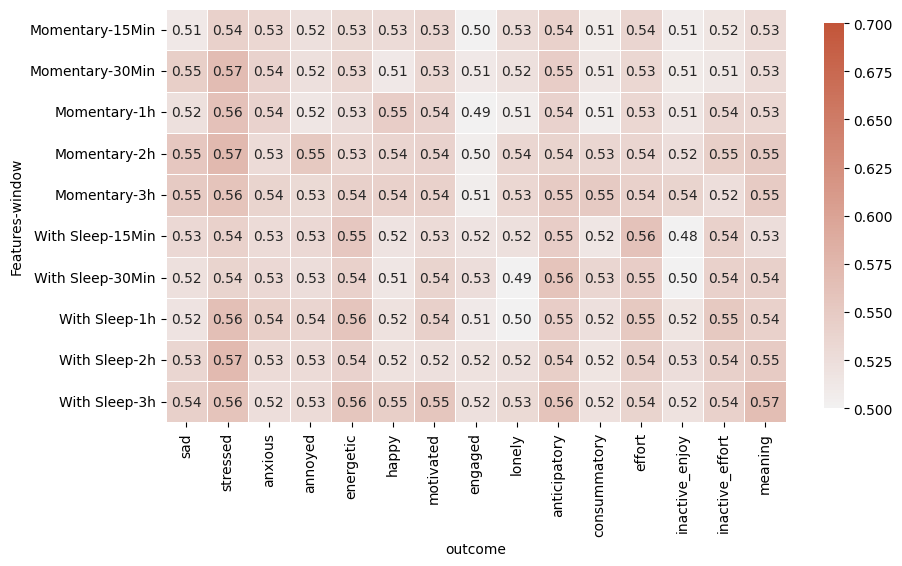

In [54]:
import itertools

evaluation_df["Features"] = evaluation_df["feature_set"].map(feature_set_name_map)
validation_piv = evaluation_df[
    ["outcome", "window", "Features", "validation_roc_auc"]
].pivot_table(
    index=["Features", "window"],
    columns="outcome",
    values="validation_roc_auc",
    aggfunc="first",
)

index_order = [
    (f"{feature_set_name_map[feature_set_name]}", f"{window}")
    for feature_set_name, feature_set_cols in feature_sets.items()
    for window in windows
]
validation_piv = validation_piv.reindex(index=index_order, columns=outcomes)
fig, ax = plt.subplots(figsize=(10, 10))
plots.heatmap_correlation(validation_piv, ax=ax, vmin=0.5, vmax=0.7, center=0.5)

meaning 0.4783948004886159
0.5365145047753404 0.5015560505624918
meaning 0.49216081325577327
0.5365145047753404 0.5144790180727862
meaning 0.5023258470811336
0.5365145047753404 0.531002926602035
meaning 0.5037476362226164
0.5365145047753404 0.5306958111279609
meaning 0.5097463151372612
0.5365145047753404 0.5365145047753404
meaning 0.4715615051118499
0.5365145047753404 0.500594106951445
meaning 0.4865284976465812
0.5365145047753404 0.5112700296509107
meaning 0.47022966614489947
0.5365145047753404 0.4928328967065565
meaning 0.5088272974277799
0.5365145047753404 0.5317227857050065
meaning 0.4880688125416029
0.5365145047753404 0.5128004929261207


(10.1, -0.1)

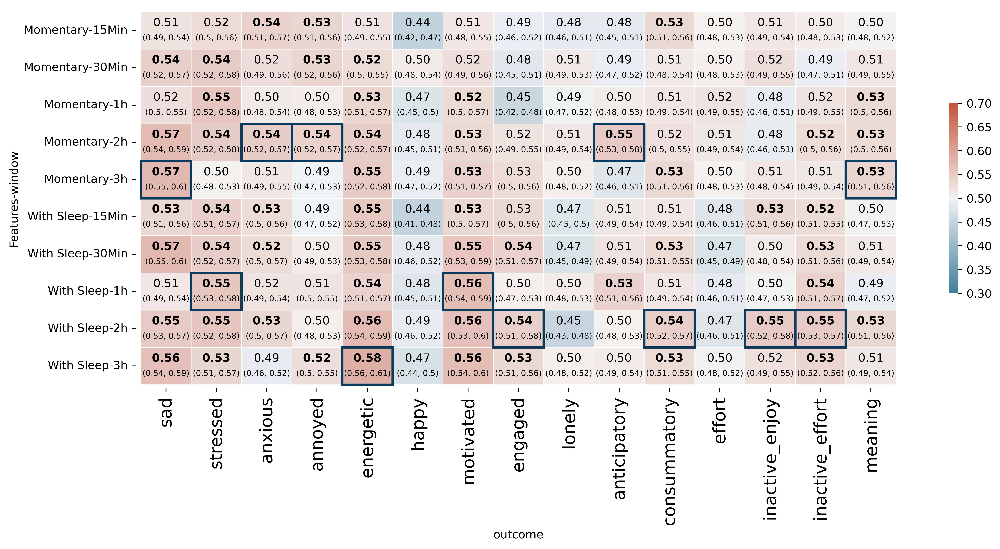

In [55]:
import matplotlib.patches as patches

# Set DPI to 700


test_piv = evaluation_df[
    [
        "outcome",
        "window",
        "Features",
        "test_roc_auc",
    ]
].pivot_table(
    index=["Features", "window"],
    columns="outcome",
    values="test_roc_auc",
    aggfunc="first",
)
test_piv_n = evaluation_df[["outcome", "window", "Features", "test_users"]].pivot_table(
    index=["Features", "window"],
    columns="outcome",
    values="test_users",
    aggfunc="first",
)

index_order = [
    (f"{feature_set_name_map[feature_set_name]}", f"{window}")
    for feature_set_name, feature_set_cols in feature_sets.items()
    for window in windows
]
test_piv = test_piv.reindex(index=index_order, columns=outcomes)
test_piv_n = test_piv_n.reindex(index=index_order, columns=outcomes)

fig, ax = plt.subplots(figsize=(15, 6), dpi=700)
plots.heatmap_correlation(
    test_piv, ax=ax, vmin=0.3, vmax=0.7, center=0.5, annot=False, square=False
)

ax.set_xticklabels(ax.get_xticklabels(), fontsize=15, rotation=90)

# Box around significant cells (lower auroc > than 0.5)
for i, j in itertools.product(range(test_piv.shape[0]), range(test_piv.shape[1])):
    feature_set = test_piv.index[i][0]
    window = test_piv.index[i][1]
    outcome = test_piv.columns[j]
    lower_auroc = result_summary_df[
        (result_summary_df["Features"] == feature_set)
        & (result_summary_df["window"] == window)
        & (result_summary_df["outcome"] == outcome)
    ].lower_auroc.values[0]
    max_sig_auroc = (
        test_piv.reset_index()
        .merge(
            result_summary_df[
                (result_summary_df["outcome"] == outcome)
                & (result_summary_df["lower_auroc"] > 0.5)
            ][["Features", "window", "outcome"]]
        )[outcome]
        .max()
    )

    if outcome == "meaning":
        print(outcome, lower_auroc)
        print(max_sig_auroc, test_piv.iloc[i, j])

    ax.text(
        j + 0.5,
        i + 0.3,
        result_summary_table.iloc[i, j].split(" ")[0][:4],
        fontsize=10,
        ha="center",
        va="center",
        fontdict={"fontweight": "bold"} if lower_auroc > 0.5 else {},
    )
    # Write in confidence intervals on each cell
    ax.text(
        j + 0.5,
        i + 0.7,
        f"({result_summary_table_ci.iloc[i, j]})",
        fontsize=7,
        ha="center",
        va="center",
    )
    if lower_auroc > 0.5:
        # if best row in column
        if test_piv.iloc[i, j] == max_sig_auroc:
            ax.add_patch(
                patches.Rectangle(
                    (j, i),
                    1,
                    1,
                    fill=False,
                    edgecolor=ucla_darkest_blue,
                    lw=2,
                )
            )
# increase xlim and ylim to make room for the box edges
ax.set_xlim(ax.get_xlim()[0] - 0.1, ax.get_xlim()[1] + 0.1)
ax.set_ylim(ax.get_ylim()[0] + 0.1, ax.get_ylim()[1] - 0.1)

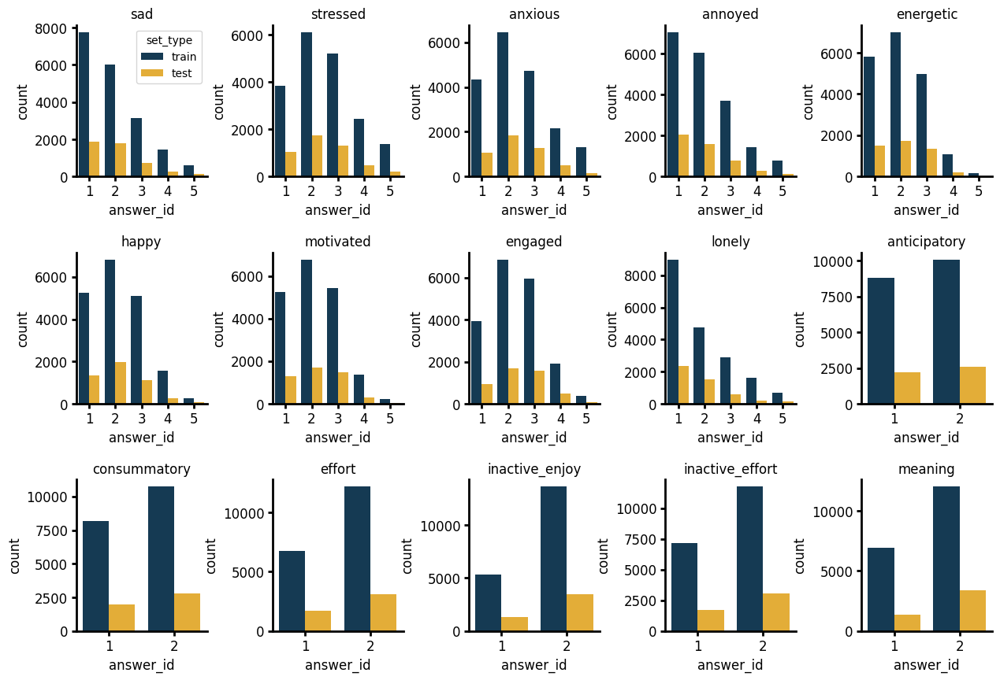

In [56]:
fig, axes = plt.subplots(figsize=(15, 10), nrows=3, ncols=5)
qc_ema["set_type"] = None
qc_ema.loc[qc_ema.user_id.isin(train_users), "set_type"] = "train"
qc_ema.loc[qc_ema.user_id.isin(test_users), "set_type"] = "test"
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for outcome, ax in zip(outcomes, axes.flatten()):
    outcome_ema = qc_ema[
        (qc_ema["question_label"] == outcome)
        & (qc_ema["user_id"].isin([*train_users, *test_users]))
    ].copy()
    outcome_ema["answer_id"] = outcome_ema["answer_id"].astype(int)
    nbins = outcome_ema["answer_id"].nunique()
    binwidth = 1
    sns.countplot(
        data=outcome_ema,
        ax=ax,
        x="answer_id",
        hue="set_type",
        hue_order=["train", "test"],
        palette=[ucla_darkest_blue, ucla_darkest_gold],
        legend=(outcome == "sad"),
    )
    # ax.set_xticks(np.arange(nbins+1)+1)
    ax.set_title(outcome, fontsize=12)
    fa.despine_thicken_axes(ax, fontsize=12)

In [57]:
qc_ema_piv = (
    qc_ema.loc[
        qc_ema.q_id.isin(use_qids),
        [
            "user_id",
            "session_start",
            "question_label",
            "binary_answer",
            "set_type",
        ],
    ]
    .pivot_table(
        index=["user_id", "session_start", "set_type"],
        columns="question_label",
        values="binary_answer",
        aggfunc="first",
    )
    .reset_index()
)
avail_dfs = []
feature_set_name = "momentary_hk_sleep"
feature_set_cols = momentary_features + sleep_features
for window, window_hk in qc_hk.groupby("QC_expected_duration"):
    hk_ema_df = qc_ema_piv.merge(
        window_hk[["user_id", "survey_start", *feature_set_cols]].rename(
            columns={"survey_start": "session_start"}
        ),
        on=["user_id", "session_start"],
    )

    # calculate % available for each feature split by train/test
    hk_count_df = hk_ema_df.groupby("set_type").count()
    hk_avail_df = hk_count_df[feature_set_cols].div(hk_count_df["user_id"], axis=0)
    hk_avail_df["window"] = window
    avail_dfs.append(hk_avail_df)

hk_availability = pd.concat(avail_dfs)
hk_availability

,audioExposure_hours,audioExposure_mean,audioExposure_count,audioExposure_entries,StepCount_sum,StepCount_count,StepCount_duration,BasalEnergyBurned_sum,BasalEnergyBurned_count,BasalEnergyBurned_duration,...,sleep_Awake_mean,sleep_Awake_count,sleep_bedrestNoise_day,sleep_sleepOnsetLatency_day,sleep_sleepOnsetHours_day,sleep_sleepOffsetHours_day,sleep_bedrestOffsetHours_day,sleep_bedrestOnsetHours_day,sleep_bedrestDuration_day,window
set_type,,,,,,,,,,,,,,,,,,,,,
test,1.0,0.416182,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.734513,0.734513,0.662200,0.747155,0.747155,0.747155,0.841214,0.841214,0.891783,15Min
train,1.0,0.420297,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.613468,0.613468,0.599684,0.650206,0.650206,0.650206,0.754474,0.754474,0.803920,15Min
test,1.0,0.794823,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.729993,0.729993,0.657801,0.742341,0.742341,0.742341,0.837331,0.837331,0.889337,1h
train,1.0,0.817381,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.611071,0.611071,0.597857,0.647738,0.647738,0.647738,0.753571,0.753571,0.804107,1h
test,1.0,0.794684,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.725710,0.725710,0.655133,0.738084,0.738084,0.738084,0.834097,0.834097,0.887259,2h
train,1.0,0.818826,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.606966,0.606966,0.595509,0.643869,0.643869,0.643869,0.752101,0.752101,0.803454,2h
test,1.0,0.793678,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.733399,0.733399,0.659642,0.745896,0.745896,0.745896,0.839500,0.839500,0.891448,30Min
train,1.0,0.815626,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.611796,0.611796,0.597250,0.648561,0.648561,0.648561,0.753452,0.753452,0.803413,30Min
test,1.0,0.795516,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.724411,0.724411,0.655118,0.736866,0.736866,0.736866,0.833333,0.833333,0.886322,3h


<Axes: xlabel='feature', ylabel='window-set_type'>

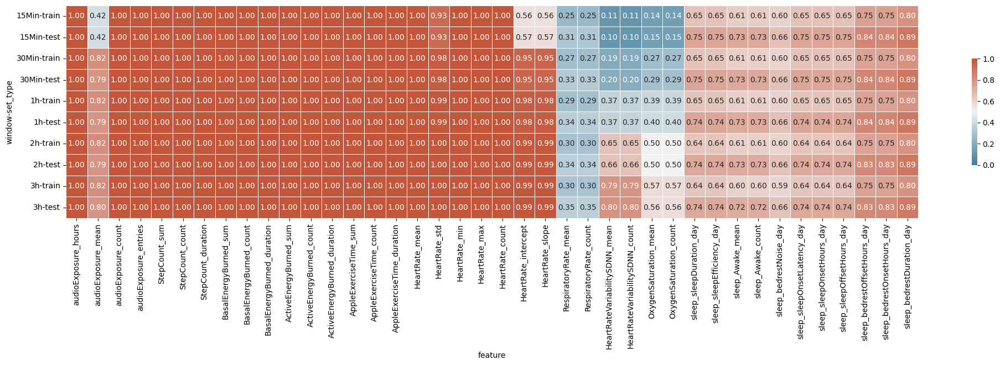

In [58]:
fig, ax = plt.subplots(figsize=(25, 5))
avail_piv = (
    hk_availability.reset_index()
    .melt(
        id_vars=["set_type", "window"],
        value_vars=feature_set_cols,
        var_name="feature",
        value_name="perc_avail",
    )
    .pivot_table(index=["window", "set_type"], columns="feature", values="perc_avail")
    .reindex(
        columns=feature_set_cols,
        index=[
            ("15Min", "train"),
            ("15Min", "test"),
            ("30Min", "train"),
            ("30Min", "test"),
            ("1h", "train"),
            ("1h", "test"),
            ("2h", "train"),
            ("2h", "test"),
            ("3h", "train"),
            ("3h", "test"),
        ],
    )
)
plots.heatmap_correlation(avail_piv, ax=ax, vmin=0, vmax=1, center=0.5)

In [59]:
answer_counts = (
    qc_ema[
        qc_ema.question_label.isin(outcomes)
        & qc_ema.user_id.isin([*train_users, *test_users])
    ]
    .groupby("question_label")
    .binary_answer.value_counts()
    .unstack()
    .fillna(0)
)

answer_counts["% True"] = answer_counts[True] / (
    answer_counts[True] + answer_counts[False]
)
answer_counts.to_clipboard()
answer_counts

binary_answer,False,True,% True
question_label,,,
annoyed,9097,14691,0.617580
anticipatory,12672,11029,0.465339
anxious,5400,18391,0.773023
consummatory,13525,10166,0.429108
effort,15268,8425,0.355590
energetic,7293,16490,0.693352
engaged,4878,18912,0.794956
happy,6602,17185,0.722453
inactive_effort,14785,8902,0.375818


## Sensitivity to data availability analysis

count    19770.000000
mean         9.906778
std          5.278482
min          0.000000
25%          6.000000
50%          8.000000
75%         15.000000
max         21.000000
dtype: float64

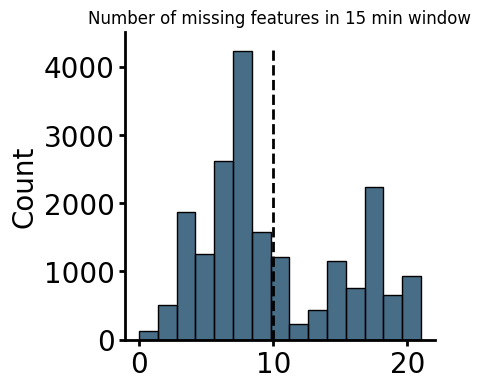

In [60]:
min_duration_hk = qc_hk[qc_hk.QC_expected_duration == "15Min"]
fig, ax = plt.subplots(figsize=(4, 4))
missing_feat_threshold = 10
n_missing = min_duration_hk[momentary_features + sleep_features].isnull().sum(axis=1)
sns.histplot(
    data=n_missing,
    ax=ax,
    bins=15,
    color=ucla_darkest_blue,
)
ax.vlines(missing_feat_threshold, 0, 4300, color="k", linestyle="dashed", linewidth=2)
fa.despine_thicken_axes(ax)
ax.set_title("Number of missing features in 15 min window")
higher_avail_ts = min_duration_hk.loc[
    n_missing < missing_feat_threshold, ["user_id", "survey_start"]
].rename(columns={"survey_start": "session_start"})
n_missing.describe()

In [61]:
evaluation_df["session_start"] = pd.to_datetime(evaluation_df["session_start"])

In [62]:
use_eval_df = evaluation_df[
    (evaluation_df.outcome == outcome)
    & (evaluation_df.feature_set == feature_set_name)
    & (evaluation_df.window == window)
].merge(higher_avail_ts, how="inner")
use_eval_df

,pred_proba,pred,actual,session_start,user_id,outcome,model,window,feature_set,validation_roc_auc,test_roc_auc,test_size,test_users,Features
0,0.365040,0,0,2022-10-10 19:41:22.353,46,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep
1,0.365040,0,0,2022-10-10 21:37:35.542,46,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep
2,0.365040,0,0,2022-10-10 23:59:59.394,46,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep
3,0.365040,0,0,2022-10-11 02:25:22.640,46,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep
4,0.365040,0,0,2022-10-11 19:29:43.142,46,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2704,0.364528,0,1,2024-03-28 02:01:30.565,393,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep
2705,0.364528,0,0,2024-03-28 19:14:10.451,393,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep
2706,0.364528,0,0,2024-03-28 23:40:38.598,393,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep
2707,0.364400,0,0,2024-03-29 01:50:08.464,393,meaning,lgbm,3h,momentary_hk_sleep,0.567026,0.5128,4403,50,With Sleep


In [63]:
high_avail_eval_dfs = []
high_evail_boot_dfs = []
n_boot = 50
for outcome in alive_it(outcomes, force_tty=True):
    for feature_set_name, feature_set_cols in feature_sets.items():
        for window in windows:
            use_eval_df = evaluation_df[
                (evaluation_df.outcome == outcome)
                & (evaluation_df.feature_set == feature_set_name)
                & (evaluation_df.window == window)
            ].merge(higher_avail_ts, how="inner")

            # Calculate ROC AUC bootstrap confidence interval
            resBoot = bootstrapPerformance(
                use_eval_df,
                unit="user_id",
                n_boot=n_boot,
                samples_per_group=samples_per_group,
                random_state=42,
                pred_col="pred_proba",
                true_col="actual",
            )
            resBoot["outcome"] = outcome
            resBoot["window"] = window
            resBoot["feature_set"] = feature_set_name

            high_evail_boot_dfs.append(resBoot)
            res = use_eval_df[["outcome", "feature_set", "window"]].copy()
            res["n"] = use_eval_df.shape[0]
            res["test_roc_auc"] = resBoot["auroc"].median()
            high_avail_eval_dfs.append(res)

high_avail_evaluation_df = pd.concat(high_avail_eval_dfs)
high_avail_evaluation_df

|████████████████████████████████████████| 15/15 [100%] in 29.9s (0.49/s)       


,outcome,feature_set,window,n,test_roc_auc
0,sad,momentary_hk,15Min,2716,0.534380
1,sad,momentary_hk,15Min,2716,0.534380
2,sad,momentary_hk,15Min,2716,0.534380
3,sad,momentary_hk,15Min,2716,0.534380
4,sad,momentary_hk,15Min,2716,0.534380
...,...,...,...,...,...
2704,meaning,momentary_hk_sleep,3h,2709,0.517497
2705,meaning,momentary_hk_sleep,3h,2709,0.517497
2706,meaning,momentary_hk_sleep,3h,2709,0.517497
2707,meaning,momentary_hk_sleep,3h,2709,0.517497


In [64]:
high_avail_evaluation_df.n.max() / 4796

np.float64(0.5663052543786489)

In [65]:
high_avail_boot_df = pd.concat(high_evail_boot_dfs)
high_avail_boot_df

,auroc,auprc,n,outcome,window,feature_set
0,0.532716,0.659173,4600,sad,15Min,momentary_hk
1,0.529102,0.650468,4600,sad,15Min,momentary_hk
2,0.541856,0.659661,4600,sad,15Min,momentary_hk
3,0.546538,0.663429,4600,sad,15Min,momentary_hk
4,0.519215,0.650758,4600,sad,15Min,momentary_hk
...,...,...,...,...,...,...
45,0.515870,0.316665,4600,meaning,3h,momentary_hk_sleep
46,0.519040,0.321250,4600,meaning,3h,momentary_hk_sleep
47,0.517401,0.327032,4600,meaning,3h,momentary_hk_sleep
48,0.507730,0.318770,4600,meaning,3h,momentary_hk_sleep


In [66]:
peak_bootstrap_df = bootstrap_df.merge(peak_param_df)
peak_bootstrap_df

,auroc,auprc,n,outcome,window,model,feature_set,window_minutes,Features,median_auroc,lower_auroc,upper_auroc,bf_alpha,train_n,test_n,auroc_str,feature_set-window
0,0.566738,0.660093,5000,sad,3h,xgboost,momentary_hk,180,Momentary,0.572547,0.547349,0.601692,0.000333,17707,4412,"0.573 (0.547, 0.602)",momentary_hk 3h
1,0.579406,0.659686,5000,sad,3h,xgboost,momentary_hk,180,Momentary,0.572547,0.547349,0.601692,0.000333,17707,4412,"0.573 (0.547, 0.602)",momentary_hk 3h
2,0.570607,0.659130,5000,sad,3h,xgboost,momentary_hk,180,Momentary,0.572547,0.547349,0.601692,0.000333,17707,4412,"0.573 (0.547, 0.602)",momentary_hk 3h
3,0.576927,0.675003,5000,sad,3h,xgboost,momentary_hk,180,Momentary,0.572547,0.547349,0.601692,0.000333,17707,4412,"0.573 (0.547, 0.602)",momentary_hk 3h
4,0.590157,0.673418,5000,sad,3h,xgboost,momentary_hk,180,Momentary,0.572547,0.547349,0.601692,0.000333,17707,4412,"0.573 (0.547, 0.602)",momentary_hk 3h
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,0.548342,0.384691,5000,inactive_effort,2h,rf,momentary_hk_sleep,120,With Sleep,0.550700,0.525722,0.570746,0.000333,17633,4401,"0.551 (0.526, 0.571)",momentary_hk_sleep 2h
14996,0.543412,0.357288,5000,inactive_effort,2h,rf,momentary_hk_sleep,120,With Sleep,0.550700,0.525722,0.570746,0.000333,17633,4401,"0.551 (0.526, 0.571)",momentary_hk_sleep 2h
14997,0.551132,0.379254,5000,inactive_effort,2h,rf,momentary_hk_sleep,120,With Sleep,0.550700,0.525722,0.570746,0.000333,17633,4401,"0.551 (0.526, 0.571)",momentary_hk_sleep 2h
14998,0.552121,0.362492,5000,inactive_effort,2h,rf,momentary_hk_sleep,120,With Sleep,0.550700,0.525722,0.570746,0.000333,17633,4401,"0.551 (0.526, 0.571)",momentary_hk_sleep 2h


In [67]:
# Get best feature set for each outcome
peak_high_avail_boot_df = high_avail_boot_df.merge(peak_param_df)
peak_bootstrap_df = bootstrap_df.merge(peak_param_df)
peak_bootstrap_df["sample"] = "Full"
peak_high_avail_boot_df["sample"] = "Missing <10 features"

comp_avail = pd.concat([peak_bootstrap_df, peak_high_avail_boot_df])

# test difference
test_res = []
for outcome in outcomes:
    full_auroc = peak_bootstrap_df[peak_bootstrap_df["outcome"] == outcome]["auroc"]
    high_avail_auroc = peak_high_avail_boot_df[
        peak_high_avail_boot_df["outcome"] == outcome
    ]["auroc"]
    res = pg.mwu(full_auroc, high_avail_auroc)
    res["full_mean"] = full_auroc.mean()
    res["high_avail_mean"] = high_avail_auroc.mean()
    res["difference"] = full_auroc.mean() - high_avail_auroc.mean()
    res["outcome"] = outcome
    test_res.append(res)

comp_avail_test_df = pd.concat(test_res).merge(peak_param_df)
comp_avail_test_df["p-corr"] = pg.multicomp(
    comp_avail_test_df["p-val"].astype(float), method="bonf"
)[1]
comp_avail_test_df.sort_values(by="p-corr")

,U-val,alternative,p-val,RBC,CLES,full_mean,high_avail_mean,difference,outcome,window,...,feature_set,median_auroc,lower_auroc,upper_auroc,bf_alpha,train_n,test_n,auroc_str,feature_set-window,p-corr
2,49914.0,two-sided,1.111120e-32,0.99656,0.99828,0.545480,0.508538,0.036942,anxious,2h,...,momentary_hk,0.545467,0.517636,0.572425,0.000333,17719,4412,"0.545 (0.518, 0.572)",momentary_hk 2h,1.666679e-31
14,176.0,two-sided,1.858986e-32,-0.99296,0.00352,0.536515,0.567373,-0.030858,meaning,3h,...,momentary_hk,0.536866,0.509746,0.562380,0.000333,17640,4403,"0.537 (0.510, 0.562)",momentary_hk 3h,2.788480e-31
10,2066.0,two-sided,6.009882e-28,-0.91736,0.04132,0.543325,0.563092,-0.019767,consummatory,2h,...,momentary_hk_sleep,0.543458,0.515358,0.573212,0.000333,17640,4399,"0.543 (0.515, 0.573)",momentary_hk_sleep 2h,9.014823e-27
11,2451.0,two-sided,4.512173e-27,-0.90196,0.04902,0.519996,0.539792,-0.019797,effort,1h,...,momentary_hk,0.520190,0.493142,0.546021,0.000333,17641,4401,"0.520 (0.493, 0.546)",momentary_hk 1h,6.768259e-26
12,6162.0,two-sided,2.221236e-19,-0.75352,0.12324,0.551204,0.565035,-0.013831,inactive_enjoy,2h,...,momentary_hk_sleep,0.551596,0.523239,0.579661,0.000333,17640,4405,"0.552 (0.523, 0.580)",momentary_hk_sleep 2h,3.331854e-18
0,8467.0,two-sided,2.782650e-15,-0.66132,0.16934,0.572730,0.583437,-0.010707,sad,3h,...,momentary_hk,0.572547,0.547349,0.601692,0.000333,17707,4412,"0.573 (0.547, 0.602)",momentary_hk 3h,4.173975e-14
9,9495.0,two-sided,1.272155e-13,-0.62020,0.18990,0.550446,0.560041,-0.009594,anticipatory,2h,...,momentary_hk,0.550779,0.525576,0.576047,0.000333,17647,4402,"0.551 (0.526, 0.576)",momentary_hk 2h,1.908232e-12
8,35982.0,two-sided,1.540408e-07,0.43928,0.71964,0.516296,0.509666,0.006629,lonely,2h,...,momentary_hk,0.516226,0.489127,0.541356,0.000333,17719,4412,"0.516 (0.489, 0.541)",momentary_hk 2h,2.310612e-06
7,14718.0,two-sided,8.962093e-07,-0.41128,0.29436,0.544000,0.551467,-0.007467,engaged,2h,...,momentary_hk_sleep,0.543925,0.508264,0.577916,0.000333,17717,4413,"0.544 (0.508, 0.578)",momentary_hk_sleep 2h,1.344314e-05
5,33592.0,two-sided,4.033225e-05,0.34368,0.67184,0.508435,0.502046,0.006389,happy,30Min,...,momentary_hk,0.508162,0.480722,0.536529,0.000333,17719,4410,"0.508 (0.481, 0.537)",momentary_hk 30Min,6.049837e-04


In [68]:
feature_set_name_map = {
    "momentary_hk": "momentary",
    "momentary_hk_sleep": "with sleep",
}
comp_avail_test_df = comp_avail_test_df[comp_avail_test_df.lower_auroc > 0.5]
comp_avail_test_df["Features"] = comp_avail_test_df["feature_set"].map(
    feature_set_name_map
)
comp_avail_test_df[
    [
        "outcome",
        "Features",
        "window",
        "full_mean",
        "high_avail_mean",
        "difference",
        "p-corr",
    ]
].sort_values(by="p-corr").to_clipboard(index=False)
comp_avail_test_df[
    [
        "outcome",
        "Features",
        "window",
        "full_mean",
        "high_avail_mean",
        "difference",
        "p-corr",
    ]
].sort_values(by="p-corr")

,outcome,Features,window,full_mean,high_avail_mean,difference,p-corr
2,anxious,momentary,2h,0.545480,0.508538,0.036942,1.666679e-31
14,meaning,momentary,3h,0.536515,0.567373,-0.030858,2.788480e-31
10,consummatory,with sleep,2h,0.543325,0.563092,-0.019767,9.014823e-27
12,inactive_enjoy,with sleep,2h,0.551204,0.565035,-0.013831,3.331854e-18
0,sad,momentary,3h,0.572730,0.583437,-0.010707,4.173975e-14
9,anticipatory,momentary,2h,0.550446,0.560041,-0.009594,1.908232e-12
7,engaged,with sleep,2h,0.544000,0.551467,-0.007467,1.344314e-05
6,motivated,with sleep,3h,0.566854,0.564732,0.002122,5.423056e-01
1,stressed,with sleep,1h,0.554037,0.552570,0.001467,1.000000e+00
3,annoyed,momentary,2h,0.541440,0.539943,0.001498,1.000000e+00


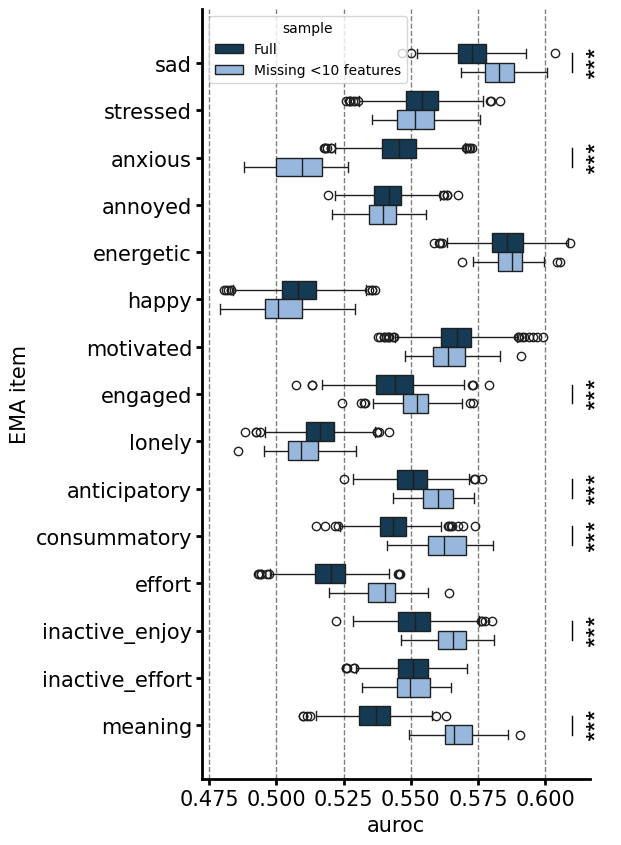

In [69]:
# box plot, x-axis outcome, y-axis AUROC, hue=high availability or full dataset
fig, ax = plt.subplots(figsize=(5, 10))
sns.boxplot(
    ax=ax,
    data=comp_avail,
    order=outcomes,
    y="outcome",
    x="auroc",
    hue="sample",
    palette=[ucla_darkest_blue, ucla_lighter_blue],
)
ax.set_ylabel("EMA item")
fa.despine_thicken_axes(ax, fontsize=15)
ax.grid(axis="x", linestyle="--", color="black", lw=1, alpha=0.5)
for i, c in enumerate(outcomes):
    # TODO: fix this so that comp_avail looks at all outcomes
    if c not in comp_avail_test_df["outcome"].values:
        continue
    res = comp_avail_test_df[comp_avail_test_df["outcome"] == c]
    if res["p-corr"].values[0] < 0.05:
        stars = "*"
        if res["p-corr"].values[0] < 0.01:
            stars = "**"
        if res["p-corr"].values[0] < 0.001:
            stars = "***"
        ax.text(
            x=0.615,
            y=i - 0.02,
            s=stars,
            va="center",
            fontfamily="arial",
            fontsize=20,
            rotation=90,
        )
        ax.plot([0.61, 0.61], [i - 0.2, i + 0.2], lw=1, color="k")

<Axes: xlabel='outcome', ylabel='feature_set-window'>

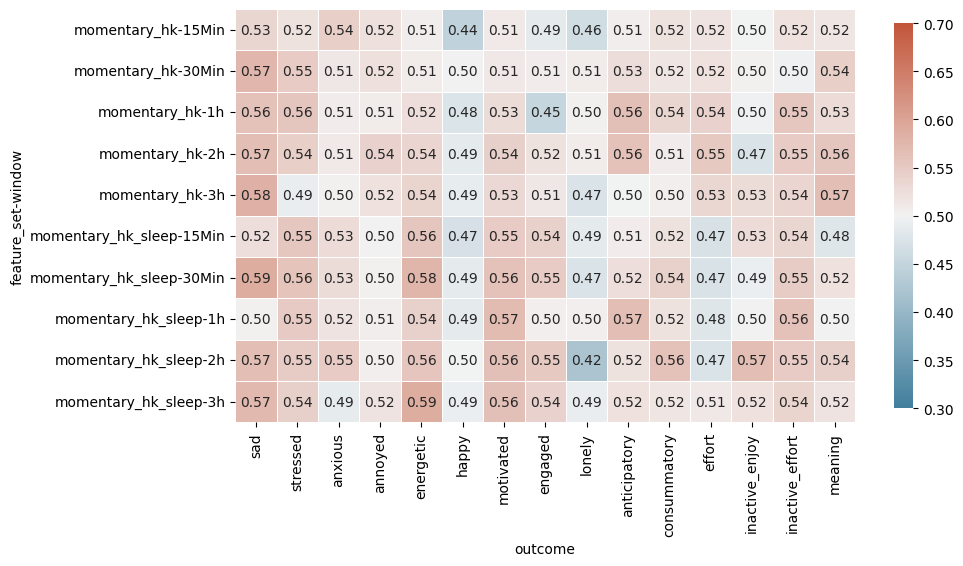

In [70]:
# for each feature set - only take entries with data available at 15Min window
high_avail_test_piv = high_avail_evaluation_df[
    ["outcome", "window", "feature_set", "test_roc_auc"]
].pivot_table(
    index=["feature_set", "window"],
    columns="outcome",
    values="test_roc_auc",
    aggfunc="first",
)

index_order = [
    (f"{feature_set_name}", f"{window}")
    for feature_set_name, feature_set_cols in feature_sets.items()
    for window in windows
]
high_avail_test_piv = high_avail_test_piv.reindex(index=index_order, columns=outcomes)

fig, ax = plt.subplots(figsize=(10, 10))
plots.heatmap_correlation(high_avail_test_piv, ax=ax, vmin=0.3, vmax=0.7, center=0.5)

In [71]:
peak_high_avail_evaluation_df = high_avail_evaluation_df.merge(peak_param_df)
peak_high_avail_evaluation_df.groupby("outcome").window.value_counts()

outcome          window
annoyed          2h        2715
anticipatory     2h        2708
anxious          2h        2716
consummatory     2h        2705
effort           1h        2707
energetic        3h        2714
engaged          2h        2716
happy            30Min     2714
inactive_effort  2h        2707
inactive_enjoy   2h        2710
lonely           2h        2716
meaning          3h        2709
motivated        3h        2716
sad              3h        2716
stressed         1h        2716
Name: count, dtype: int64

## Startified Perfomrance Analysis

### Individual AUROC

In [72]:
# Get user-level AUROC
def try_roc_auc_score(x):
    try:
        return roc_auc_score(x.actual, x.pred_proba)
    except:
        return np.nan


user_auroc = evaluation_df.groupby(
    ["outcome", "window", "feature_set", "user_id"]
).apply(try_roc_auc_score)

/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/2709782276.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(try_roc_auc_score)


In [73]:
user_auroc

outcome   window  feature_set         user_id
annoyed   15Min   momentary_hk        46         0.504092
                                      53         0.449223
                                      65         0.542757
                                      73         0.584409
                                      79         0.427451
                                                   ...   
stressed  3h      momentary_hk_sleep  381        0.454942
                                      386        0.892857
                                      388        0.398785
                                      389        0.416814
                                      393        0.470669
Length: 7500, dtype: float64

/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)
/Users/sakre/Co

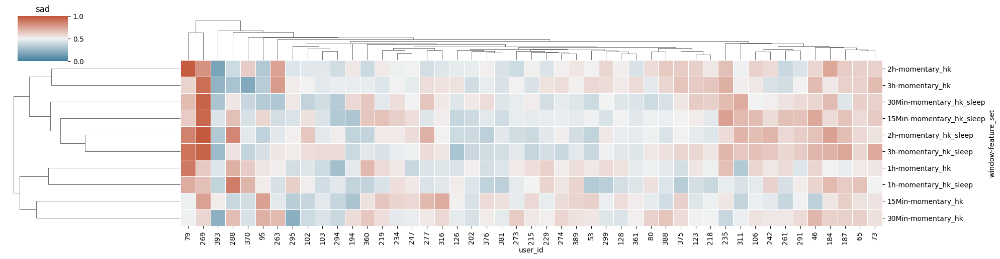

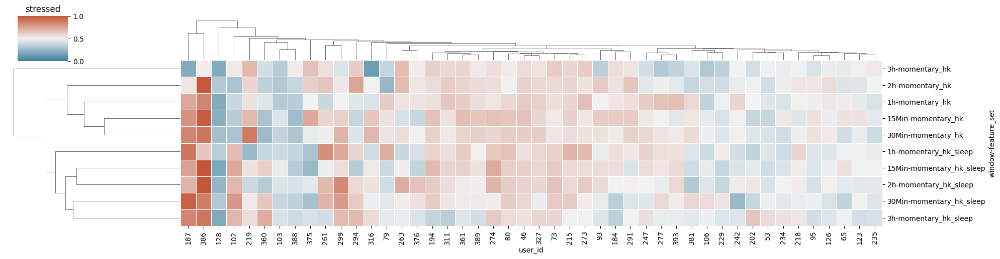

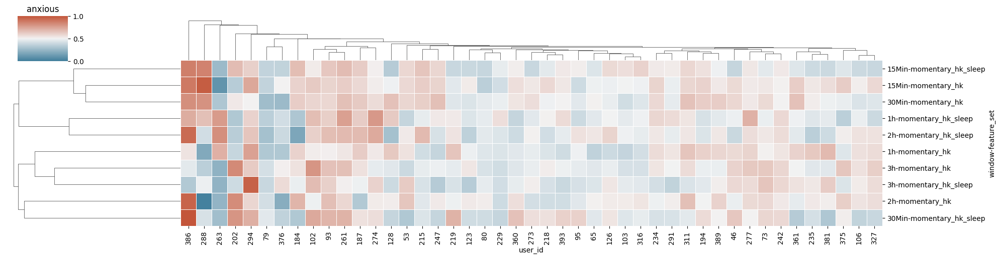

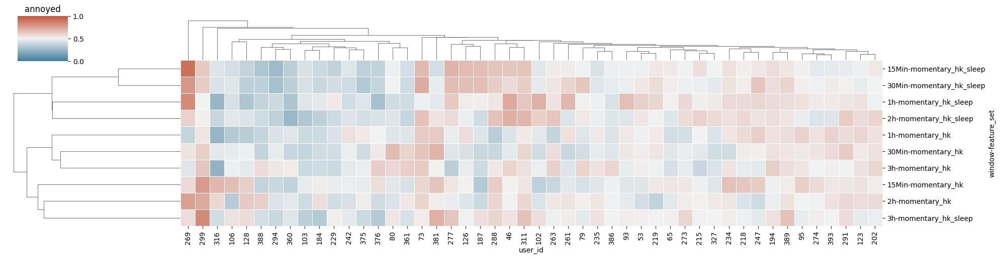

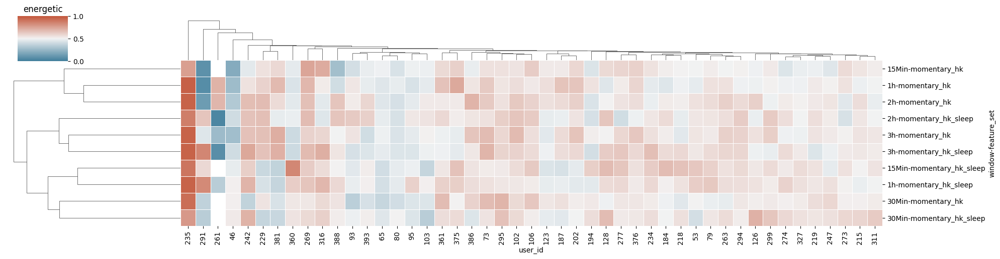

...

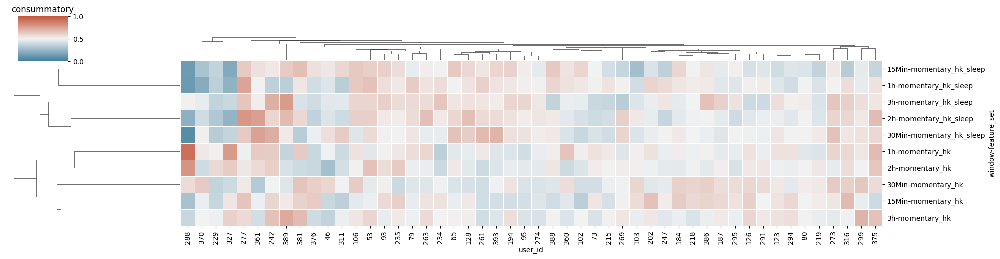

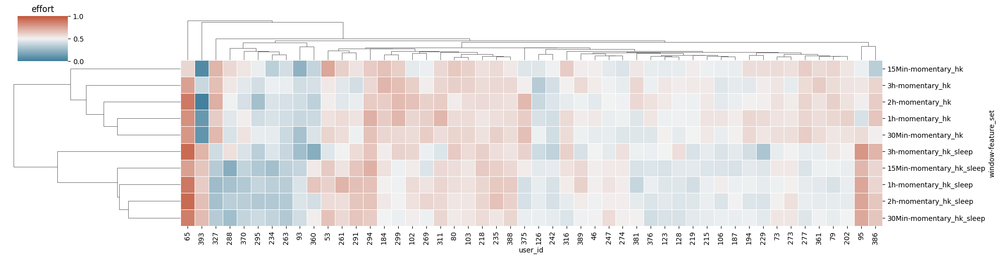

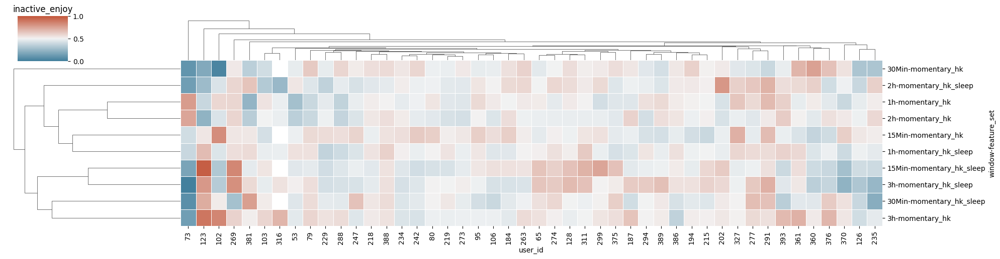

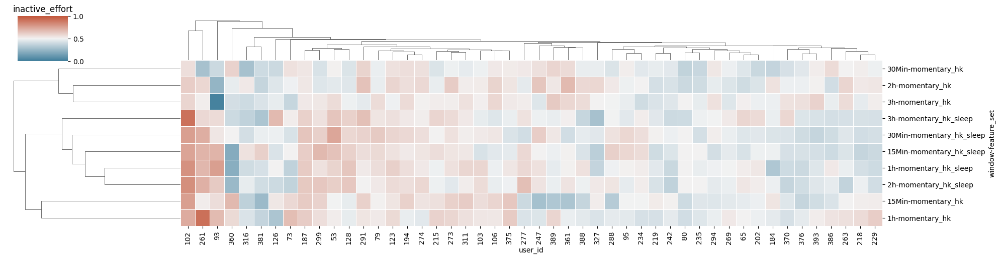

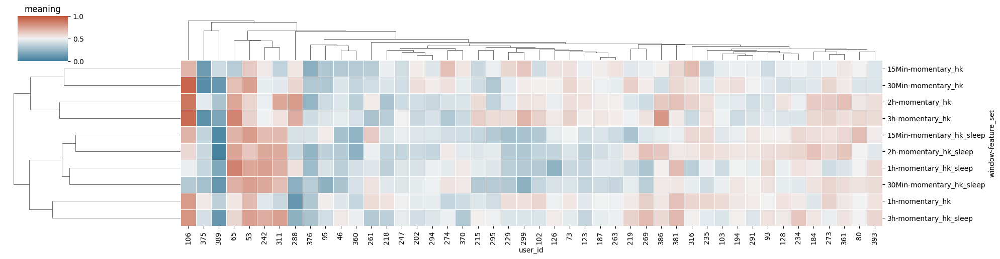

In [74]:
for outcome in outcomes:
    user_auroc_piv = user_auroc.reset_index()
    user_auroc_piv = (
        user_auroc_piv[user_auroc_piv.outcome == outcome]
        .reset_index()
        .pivot_table(index=["window", "feature_set"], columns="user_id", values=0)
    )
    plots.clustermap_correlation(
        user_auroc_piv.fillna(0.5),
        mask=user_auroc_piv.isna(),
        vmin=0,
        vmax=1,
        center=0.5,
        annot=False,
        figsize=(20, 5),
    )
    plt.title(outcome)

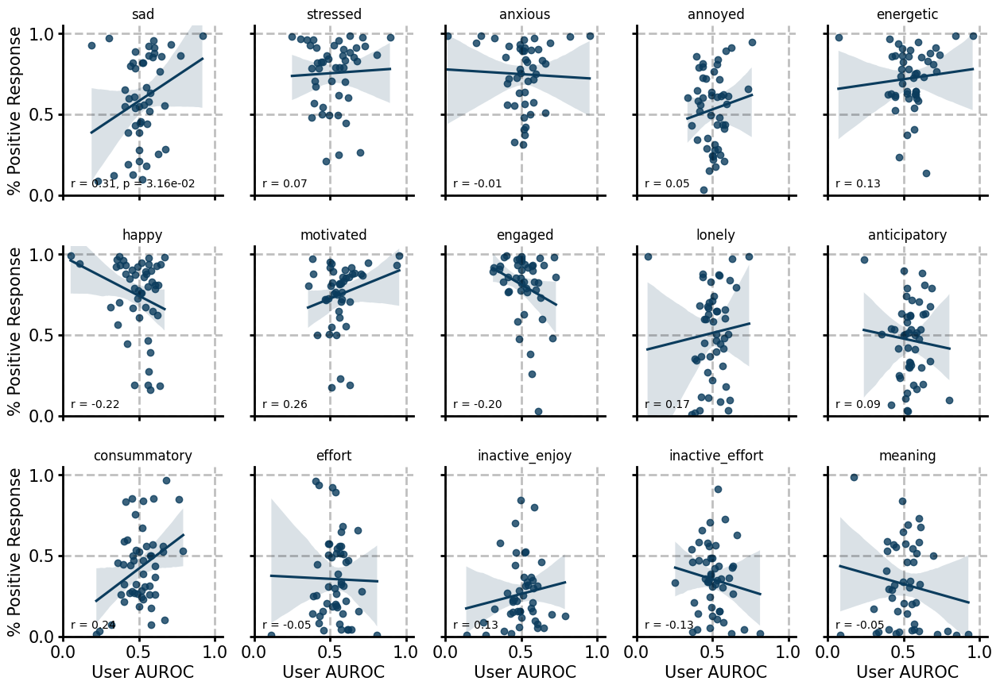

In [75]:
percent_pos = (
    test_ema.groupby(["user_id", "question_label"])
    .binary_answer.mean()
    .reset_index()
    .rename(columns={"binary_answer": "percent_pos", "question_label": "outcome"})
)
check_user_auroc = user_auroc.reset_index().rename(columns={0: "test_roc_auc"})
check_user_auroc = (
    check_user_auroc.merge(peak_param_df)
    .merge(percent_pos)
    .dropna(subset=["percent_pos", "test_roc_auc"])
)

fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10), sharey=True, sharex=True)
plt.subplots_adjust(hspace=0.3)
for i, outcome in enumerate(outcomes):
    ax = axes.flat[i]
    c_res = pg.corr(
        check_user_auroc[check_user_auroc.outcome == outcome]
        .test_roc_auc.astype(float)
        .values,
        check_user_auroc[check_user_auroc.outcome == outcome]
        .percent_pos.astype(float)
        .values,
        method="spearman",
    )
    p = c_res["p-val"].values[0]
    r = c_res["r"].values[0]
    if p > 0.05:
        ax.text(0.05, 0.05, f"r = {r:.2f}", transform=ax.transAxes)
    else:
        ax.text(0.05, 0.05, f"r = {r:.2f}, p = {p:.2e}", transform=ax.transAxes)
    sns.regplot(
        data=check_user_auroc.loc[
            check_user_auroc.outcome == outcome,
            ["percent_pos", "test_roc_auc"],
        ].astype(float),
        x="test_roc_auc",
        y="percent_pos",
        ax=ax,
        color=ucla_darkest_blue,
    )
    ax.set_ylim(0, 1.05)
    ax.set_yticks([0, 0.5, 1])
    ax.set_xlim(0, 1.05)
    ax.set_xticks([0, 0.5, 1])
    ax.set_title(outcome)
    if i % 5 == 0:
        ax.set_ylabel("% Positive Response")
    else:
        ax.set_ylabel("")
    if i >= 10:
        ax.set_xlabel("User AUROC")
    else:
        ax.set_xlabel("")
    fa.despine_thicken_axes(ax, fontsize=15)
    ax.grid(axis="both", color="k", alpha=0.25, linestyle="dashed", linewidth=2)

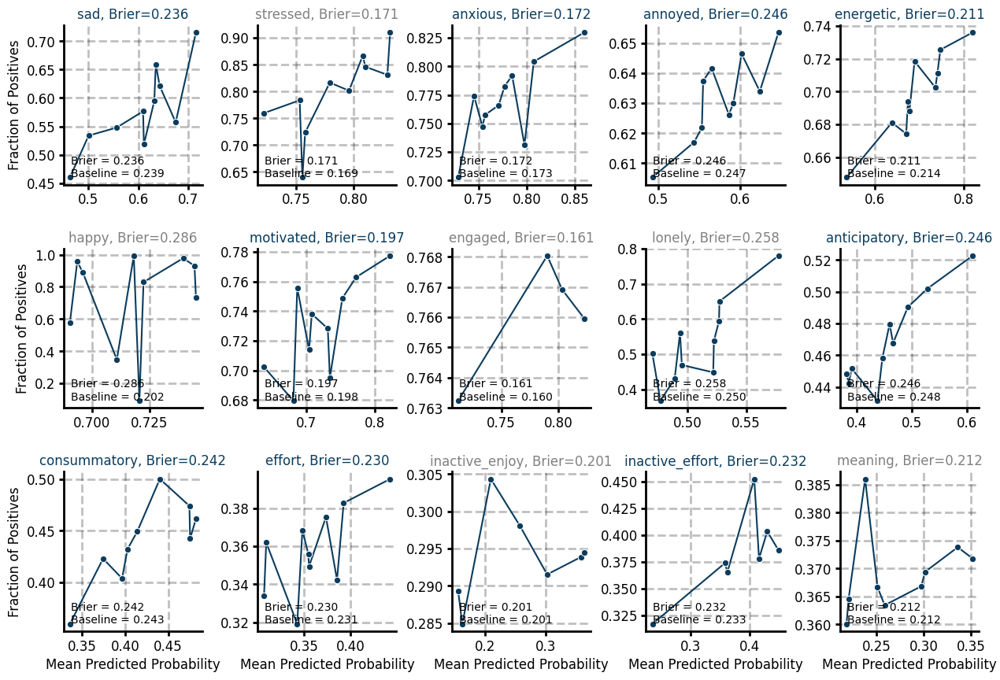

In [76]:
# Plot calibration for each outcome
calib_eval_df = evaluation_df.merge(peak_param_df).dropna(
    subset=["actual", "pred_proba"]
)
fig, axes = plt.subplots(
    nrows=3,
    ncols=5,
    figsize=(15, 10),
    sharey=False,
)
plt.subplots_adjust(hspace=0.4, wspace=0.4)
for i, outcome in enumerate(outcomes):
    ax = axes.flat[i]
    prob_true, prob_pred = calibration_curve(
        calib_eval_df[calib_eval_df.outcome == outcome].actual,
        calib_eval_df[calib_eval_df.outcome == outcome].pred_proba,
        n_bins=10,
        strategy="quantile",
    )

    baseline_prob = train_ema[train_ema.question_label == outcome].binary_answer.mean()
    baseline_brier = brier_score_loss(
        calib_eval_df[calib_eval_df.outcome == outcome].actual,
        [baseline_prob] * calib_eval_df[calib_eval_df.outcome == outcome].shape[0],
    )
    sns.lineplot(x=prob_true, y=prob_pred, ax=ax, color=ucla_darkest_blue, marker="o")
    # ax.set_ylim(0.15, .9)

    calib_score = brier_score_loss(
        calib_eval_df[calib_eval_df.outcome == outcome].actual,
        calib_eval_df[calib_eval_df.outcome == outcome].pred_proba,
    )
    ax.text(
        0.05,
        0.05,
        f"Brier = {calib_score:.3f}\nBaseline = {baseline_brier:.3f}",
        transform=ax.transAxes,
    )
    if calib_score < baseline_brier:
        ax.set_title(f"{outcome}, Brier={calib_score:.3f}", color=ucla_darkest_blue)
    else:
        ax.set_title(f"{outcome}, Brier={calib_score:.3f}", color="gray")
    if i % 5 == 0:
        ax.set_ylabel("Fraction of Positives")
    else:
        ax.set_ylabel("")
    if i >= 10:
        ax.set_xlabel("Mean Predicted Probability")
    else:
        ax.set_xlabel("")
    fa.despine_thicken_axes(ax, fontsize=12)
    ax.grid(axis="both", color="k", alpha=0.25, linestyle="dashed", linewidth=2)

## By Age, Sex, Race/Ethnicity, Anhedonia, and Depression

In [77]:
characteristics = ema_train_test_split.loc[
    ema_train_test_split.batch == 2,
    [
        "user_id",
        "Age",
        "Sex",
        "Non-hispanic white",
        "Scan-PVSS",
        "Scan-PHQ-14",
    ],
]
characteristics

,user_id,Age,Sex,Non-hispanic white,Scan-PVSS,Scan-PHQ-14
6,46.0,46.0,Male,No,7.142857,6.0
10,53.0,44.0,Female,No,5.095238,15.0
18,65.0,33.0,Male,Yes,1.571429,21.0
25,73.0,54.0,Male,No,6.523810,4.0
29,79.0,29.0,Female,No,4.761905,10.0
30,80.0,38.0,Female,No,6.619048,15.0
38,93.0,59.0,Male,No,3.428571,10.0
39,95.0,28.0,Female,Yes,3.428571,19.0
43,102.0,28.0,Female,Yes,5.285714,7.0
44,103.0,49.0,Female,No,7.333333,18.0


In [78]:
age_threshold = 29.5
PVSS_threshold = 5.95
PHQ_threshold = 13
characteristics = ema_train_test_split.loc[
    ema_train_test_split.batch == 2,
    [
        "user_id",
        "Age",
        "Sex",
        "Non-hispanic white",
        "Scan-PVSS",
        "Scan-PHQ-14",
    ],
]

characteristics.describe().T.round(2)
characteristics["Older_split"] = characteristics.Age.apply(
    lambda x: "low" if x < age_threshold else "high"
)
characteristics["Anhed_split"] = characteristics["Scan-PVSS"].apply(
    lambda x: "high" if x < PVSS_threshold else "low"
)
characteristics["Dep_split"] = characteristics["Scan-PHQ-14"].apply(
    lambda x: "low" if x < PHQ_threshold else "high"
)
characteristics["Female_split"] = characteristics.Sex.apply(
    lambda x: "low" if x == "Male" else "high"
)
characteristics["White_split"] = characteristics["Non-hispanic white"].apply(
    lambda x: "low" if x == "No" else "high"
)

characteristics.describe().T

,count,mean,std,min,25%,50%,75%,max
user_id,50.0,233.900000,106.829303,46.000000,126.500000,244.500000,308.000000,393.000000
Age,50.0,33.360000,11.929658,18.000000,24.500000,29.500000,40.750000,59.000000
Scan-PVSS,50.0,5.817143,1.338334,1.571429,5.297619,5.952381,6.702381,8.142857
Scan-PHQ-14,50.0,12.780000,4.739284,4.000000,9.250000,13.000000,15.000000,22.000000


In [79]:
evaluation_df_char = evaluation_df.merge(characteristics)

split_by_columns = [
    "Older_split",
    "White_split",
    "Female_split",
    "Anhed_split",
    "Dep_split",
]
split_perfs = []
for split_col in split_by_columns:
    split_performance = evaluation_df_char.groupby(
        ["outcome", "window", "feature_set", split_col]
    ).apply(try_roc_auc_score)
    split_performance = (
        split_performance.rename("auroc")
        .reset_index()
        .rename(columns={split_col: "split"})
    )
    split_performance["split_type"] = split_col.split("_")[0]
    split_perfs.append(split_performance)

split_performance_df = pd.concat(split_perfs)

/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/3486623481.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(try_roc_auc_score)
/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/3486623481.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(try_roc_auc_score)
/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/3486623481.py:14: DeprecationWarn

In [80]:
test_results = []
for split_col in split_by_columns:
    responses = evaluation_df_char[
        ["outcome", "user_id", split_col, "actual", "session_start"]
    ].drop_duplicates()
    for outcome in outcomes:
        resp_low = responses[
            (responses.outcome == outcome) & (responses[split_col] == "low")
        ]
        resp_high = responses[
            (responses.outcome == outcome) & (responses[split_col] == "high")
        ]
        test_res = pg.mwu(resp_low.actual, resp_high.actual)
        test_res["outcome"] = outcome
        test_res["split_type"] = split_col
        test_res["mean_diff"] = resp_high.actual.mean() - resp_low.actual.mean()
        test_results.append(test_res)
resp_diff_test = pd.concat(test_results)
resp_diff_test["p-corr"] = pg.multicomp(
    resp_diff_test["p-val"].astype(float), method="holm"
)[1]

resp_diff_test[resp_diff_test["p-corr"] < 0.05].sort_values("p-corr")

,U-val,alternative,p-val,RBC,CLES,outcome,split_type,mean_diff,p-corr
MWU,3097077.0,two-sided,2.051750e-94,0.282829,0.641414,meaning,Anhed_split,-0.282829,1.538812e-92
MWU,3096241.5,two-sided,1.850952e-93,0.278651,0.639326,happy,Anhed_split,-0.278651,1.369704e-91
MWU,3068770.5,two-sided,7.080388e-87,0.265470,0.632735,motivated,Anhed_split,-0.265470,5.168683e-85
MWU,3104630.0,two-sided,8.784926e-81,0.286580,0.643290,anticipatory,Anhed_split,-0.286580,6.325147e-79
MWU,2954675.5,two-sided,1.737548e-73,0.218489,0.609245,engaged,Anhed_split,-0.218489,1.233659e-71
MWU,2909607.5,two-sided,2.016429e-73,0.251330,0.625665,happy,Dep_split,-0.251330,1.411500e-71
MWU,3034509.5,two-sided,3.107758e-73,0.252552,0.626276,energetic,Anhed_split,-0.252552,2.144353e-71
MWU,2966699.0,two-sided,9.461986e-57,0.230016,0.615008,effort,Anhed_split,-0.230016,6.434151e-55
MWU,2826613.5,two-sided,8.342925e-55,0.213789,0.606895,motivated,Dep_split,-0.213789,5.589760e-53
MWU,1828635.0,two-sided,2.556137e-53,-0.212084,0.393958,inactive_enjoy,Dep_split,0.212084,1.687050e-51


In [81]:
resp_diff_test.pivot_table(
    index="outcome",
    columns="split_type",
    values=[
        "mean_diff",
        "p-corr",
    ],
    aggfunc="first",
).to_clipboard()

In [82]:
sig_resp_diff = resp_diff_test[resp_diff_test["p-corr"] < 0.05].sort_values("p-corr")
sig_resp_diff[
    sig_resp_diff.split_type.isin(["White_split", "Female_split", "Older_split"])
].sort_values("p-corr")
sig_resp_diff[sig_resp_diff.split_type.isin(["Female_split"])].sort_values("p-corr")

,U-val,alternative,p-val,RBC,CLES,outcome,split_type,mean_diff,p-corr
MWU,1842485.5,two-sided,1.055958e-10,-0.105263,0.447368,anticipatory,Female_split,0.105263,4.540618e-09
MWU,1876949.0,two-sided,5.377252e-08,-0.087631,0.456185,consummatory,Female_split,0.087631,1.989583e-06
MWU,1917810.0,two-sided,1.157874e-05,-0.068764,0.465618,effort,Female_split,0.068764,3.857778e-04
MWU,2192788.5,two-sided,2.121909e-04,0.060494,0.530247,lonely,Female_split,-0.060494,6.153537e-03
MWU,1942272.0,two-sided,3.091649e-04,-0.056886,0.471557,inactive_effort,Female_split,0.056886,8.656617e-03
MWU,1970817.0,two-sided,4.759577e-04,-0.046775,0.476613,stressed,Female_split,0.046775,1.285086e-02


In [83]:
peak_param_names_df = peak_param_df[
    [
        "outcome",
        "feature_set",
        "window",
        "model",
    ]
]
# use_fsw = "momentary_hk-2h"
test_results = []
aurocs = []
evaluation_df_char["feature_set-window"] = (
    evaluation_df_char.feature_set + "-" + evaluation_df_char.window
)
n_boot_split = 500
for i, outcome in enumerate(alive_it(outcomes, force_tty=True)):
    for split_type in [x.split("_")[0] for x in split_by_columns]:
        low_pred = evaluation_df_char[
            (evaluation_df_char.outcome == outcome)
            & (evaluation_df_char[split_type + "_split"] == "low")
        ].merge(peak_param_names_df)

        high_pred = evaluation_df_char[
            (evaluation_df_char.outcome == outcome)
            & (evaluation_df_char[split_type + "_split"] == "high")
        ].merge(peak_param_names_df)

        low_auroc = bootstrapPerformance(
            low_pred,
            unit="user_id",
            n_boot=n_boot_split,
            samples_per_group=50,
            random_state=42,
            pred_col="pred_proba",
            true_col="actual",
        )
        low_auroc["split_type"] = split_type
        low_auroc["outcome"] = outcome
        low_auroc["split"] = "low"
        aurocs.append(low_auroc)

        high_auroc = bootstrapPerformance(
            high_pred,
            unit="user_id",
            n_boot=n_boot_split,
            samples_per_group=50,
            random_state=42,
            pred_col="pred_proba",
            true_col="actual",
        )
        high_auroc["split_type"] = split_type
        high_auroc["outcome"] = outcome
        high_auroc["split"] = "high"
        aurocs.append(high_auroc)

        # Wilcoxon test to see if roc auc values differ
        wilcoxon_res = pg.wilcoxon(
            low_auroc.auroc.dropna().astype(float),
            high_auroc.auroc.dropna().astype(float),
            alternative="two-sided",
        )
        wilcoxon_res["outcome"] = outcome
        wilcoxon_res["split_type"] = split_type
        wilcoxon_res["low_auroc"] = low_auroc.dropna().auroc.median()
        wilcoxon_res["high_auroc"] = high_auroc.dropna().auroc.median()

        test_results.append(wilcoxon_res)

bootstrap_split_perf_test_df = pd.concat(test_results)
bootstrap_auroc_split_df = pd.concat(aurocs)
bootstrap_split_perf_test_df["p-corr"] = pg.multicomp(
    bootstrap_split_perf_test_df["p-val"].astype(float), method="bonferroni"
)[1]
bootstrap_split_perf_test_df[bootstrap_split_perf_test_df["p-corr"] < 0.05]

|████████████████████████████████████████| 15/15 [100%] in 2:31.1 (0.10/s)      


,W-val,alternative,p-val,RBC,CLES,outcome,split_type,low_auroc,high_auroc,p-corr
Wilcoxon,511.0,two-sided,2.701577e-82,-0.991840,0.025668,sad,Older,0.552707,0.595280,2.026183e-80
Wilcoxon,0.0,two-sided,1.268525e-83,1.000000,0.998120,sad,White,0.604792,0.542629,9.513938e-82
Wilcoxon,6.0,two-sided,1.315099e-83,0.999904,0.995672,sad,Female,0.612579,0.555314,9.863245e-82
Wilcoxon,39974.0,two-sided,2.426307e-12,-0.361693,0.372816,sad,Anhed,0.568550,0.575440,1.819730e-10
Wilcoxon,0.0,two-sided,1.268525e-83,-1.000000,0.000296,sad,Dep,0.525611,0.595080,9.513938e-82
...,...,...,...,...,...,...,...,...,...,...
Wilcoxon,42.0,two-sided,1.632617e-83,0.999329,0.995048,meaning,Older,0.566410,0.505523,1.224462e-81
Wilcoxon,40326.0,two-sided,5.252102e-12,-0.356072,0.375824,meaning,White,0.532233,0.541526,3.939077e-10
Wilcoxon,15894.0,two-sided,2.256938e-47,-0.746204,0.210812,meaning,Female,0.517136,0.539538,1.692703e-45
Wilcoxon,0.0,two-sided,1.268525e-83,1.000000,1.000000,meaning,Anhed,0.588678,0.449913,9.513938e-82


In [84]:
bootstrap_auroc_split_df.groupby(
    ["outcome", "split_type", "split"]
).auroc.median().sort_values(ascending=False).head(n=30)

outcome          split_type  split
inactive_enjoy   Female      low      0.684358
energetic        Female      low      0.665975
engaged          Female      low      0.665966
inactive_effort  Female      low      0.644471
motivated        Female      low      0.626602
sad              Female      low      0.612579
engaged          White       high     0.610978
sad              White       low      0.604792
inactive_enjoy   Dep         low      0.604153
energetic        White       high     0.602565
annoyed          Female      low      0.598385
sad              Older       high     0.595280
                 Dep         high     0.595080
energetic        Dep         low      0.594852
motivated        Dep         low      0.592007
inactive_effort  Older       high     0.589359
meaning          Anhed       low      0.588678
stressed         Female      low      0.588480
energetic        Older       high     0.584427
inactive_enjoy   Anhed       high     0.584419
energetic        Older   

In [85]:
bootstrap_auroc_split_df.groupby(
    ["outcome", "split_type", "split"]
).auroc.median().sort_values(ascending=False).tail(n=30)

outcome          split_type  split
happy            Dep         low      0.516408
                             high     0.515682
                 White       low      0.514173
lonely           Older       low      0.513751
effort           Older       low      0.513135
stressed         Dep         high     0.512305
annoyed          White       low      0.512069
lonely           Dep         high     0.511796
inactive_effort  Female      high     0.508085
happy            Older       high     0.507746
anxious          Older       low      0.507077
engaged          Older       low      0.506504
inactive_effort  Older       low      0.505954
lonely           Female      high     0.505567
meaning          Older       high     0.505523
happy            White       high     0.504452
inactive_enjoy   Dep         high     0.503004
effort           Anhed       high     0.500833
engaged          Dep         low      0.499855
effort           Dep         high     0.499153
lonely           Dep     

/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/3600351384.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Split"] = data["split"].map({"low": "low (false)", "high": "high (true)"})
/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/3600351384.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Split"] = data["split"].map({"low": "low (false)", "high": "high (true)"})
/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/3600351384.py:9: SettingWithC

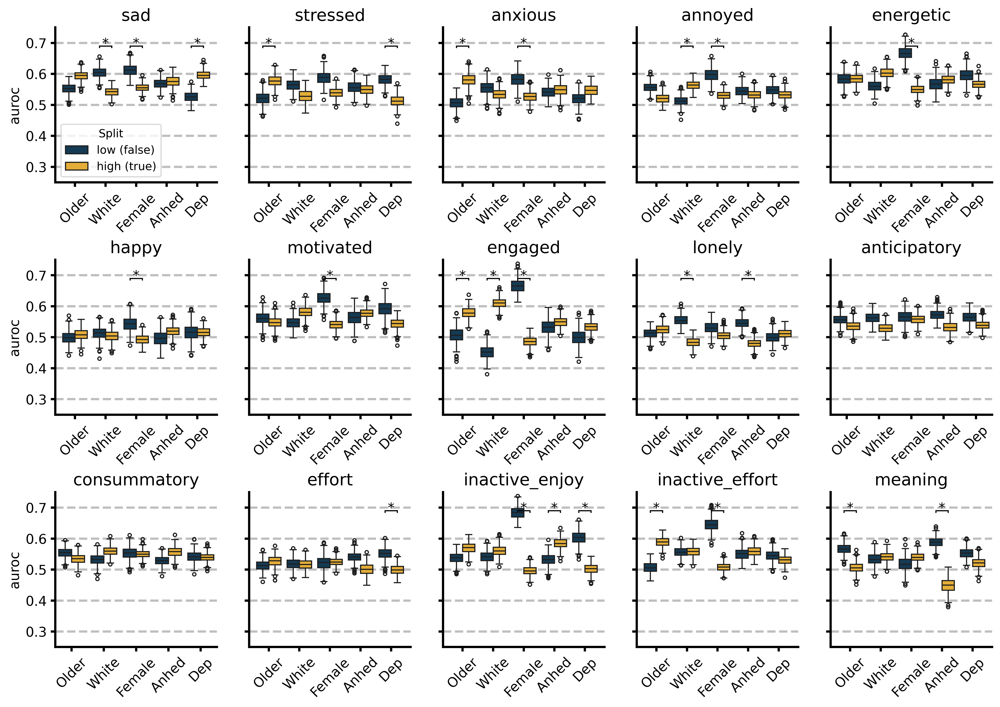

In [86]:
fig, axes = plt.subplots(
    nrows=3, ncols=5, figsize=(15, 10), sharey=True, sharex=False, dpi=500
)
plt.subplots_adjust(hspace=0.5)
n_comp_spit = len(outcomes) * len(split_by_columns)
for i, outcome in enumerate(outcomes):
    ax = axes.flatten()[i]
    data = bootstrap_auroc_split_df[(bootstrap_auroc_split_df.outcome == outcome)]
    data["Split"] = data["split"].map({"low": "low (false)", "high": "high (true)"})
    sns.boxplot(
        data=data,
        y="auroc",
        x="split_type",
        order=[x.split("_")[0] for x in split_by_columns],
        hue="Split",
        fliersize=3,
        hue_order=["low (false)", "high (true)"],
        legend=(outcome == "sad"),
        palette=[ucla_darkest_blue, ucla_darkest_gold],
        ax=ax,
    )
    ax.set_xlabel("")
    ax.set_ylim(0.25, 0.75)
    ax.set_yticks([0.3, 0.4, 0.5, 0.6, 0.7])

    ax.set_title(outcome, fontsize=15)
    fa.despine_thicken_axes(ax, fontsize=12, x_rotation=45)

    # set grid
    ax.grid(axis="y", color="k", alpha=0.25, linestyle="dashed", linewidth=2)

    # Annotate wilcoxon results on plot
    wilcoxon_res = bootstrap_split_perf_test_df[
        bootstrap_split_perf_test_df.outcome == outcome
    ].copy()
    wilcoxon_res["median_diff"] = wilcoxon_res["high_auroc"] - wilcoxon_res["low_auroc"]

    y = 0.69
    for x, split_type in enumerate([x.split("_")[0] for x in split_by_columns]):
        split_res = wilcoxon_res[wilcoxon_res["split_type"] == split_type]
        if split_res["median_diff"].abs().values[0] < 0.05:
            continue

        p = split_res["p-corr"].values[0]
        txt = "*"
        if p < 0.001:
            txt = "*"
        elif p < 0.01:
            txt = "*"
        else:
            continue
        # add horizontal line at y = 0.65
        ax.plot([x - 0.2, x + 0.2], [y, y], lw=1, color="k")
        ax.plot([x - 0.2, x - 0.2], [y, y - 0.005], lw=1, color="k")
        ax.plot([x + 0.2, x + 0.2], [y, y - 0.005], lw=1, color="k")

        ax.text(x, y - 0.005, txt, fontsize=12, ha="center")

/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


<Axes: xlabel='EMA Item', ylabel='Characteristic Split'>

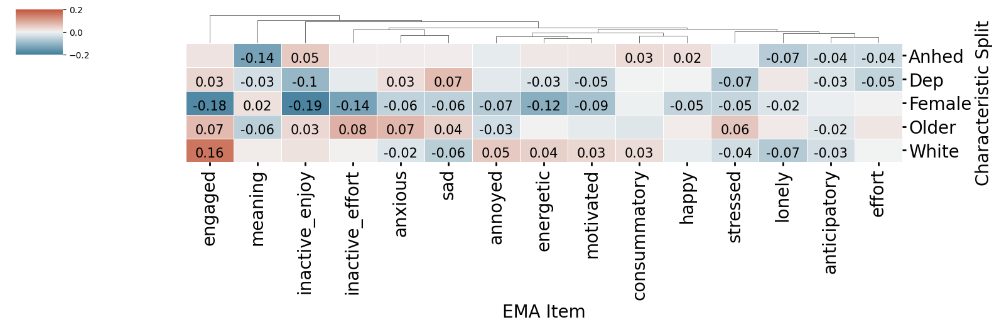

In [87]:
hl_piv = bootstrap_auroc_split_df.pivot_table(
    index=["outcome", "split_type"],
    columns="split",
    values="auroc",
    aggfunc="median",
)

hl_piv["diff"] = hl_piv["high"] - hl_piv["low"]
hl_diff = (
    hl_piv.reset_index()
    .rename(columns={"split_type": "Characteristic Split", "outcome": "EMA Item"})
    .pivot_table(
        index="EMA Item",
        columns="Characteristic Split",
        values="diff",
        aggfunc="first",
    )
)

# fig, ax = plt.subplots(figsize=(8, 5))
Axes = plots.clustermap_correlation(
    hl_diff.T,
    annot=False,
    vmin=-0.2,
    vmax=0.2,
    figsize=(15, 4),
    row_cluster=False,
)


# annotate + bold around statistically significant differences
hm = Axes.ax_heatmap
xticklabels = hm.get_xticklabels()
yticklabels = hm.get_yticklabels()


for i, j in itertools.product(
    range(hm.get_yticklabels().__len__()),
    range(hm.get_xticklabels().__len__()),
):

    outcome = xticklabels[j].get_text()
    split = yticklabels[i].get_text()
    split_res = bootstrap_split_perf_test_df[
        (bootstrap_split_perf_test_df.outcome == outcome)
        & (bootstrap_split_perf_test_df.split_type == split)
    ]
    diff_val = hl_diff.loc[xticklabels[j].get_text(), yticklabels[i].get_text()]
    if split_res.empty:
        continue
    if split_res["p-corr"].values[0] < 0.05 and abs(diff_val) > 0.02:
        hm.text(
            j + 0.5,
            i + 0.8,
            diff_val.round(2),
            fontsize=15,
            ha="center",
        )
fa.despine_thicken_axes(hm, heatmap=True, x_rotation=90)

In [88]:
cm_data = evaluation_df_char[(evaluation_df_char.outcome == "inactive_enjoy")].merge(
    peak_param_names_df
)[["pred_proba", "pred", "actual", "Female_split"]]
cm_data

,pred_proba,pred,actual,Female_split
0,0.293889,0,0,low
1,0.293889,0,0,low
2,0.293889,0,0,low
3,0.291669,0,0,low
4,0.293889,0,0,low
...,...,...,...,...
4349,0.296362,0,0,high
4350,0.296362,0,0,high
4351,0.293889,0,0,high
4352,0.293889,0,0,high


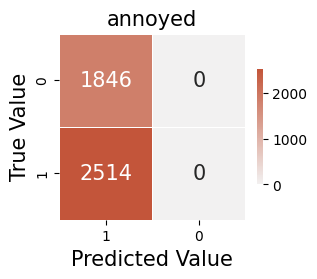

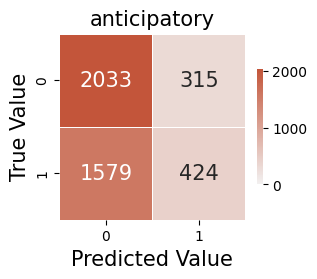

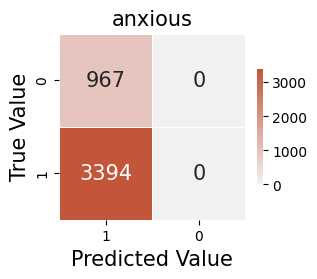

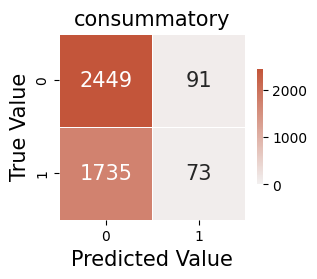

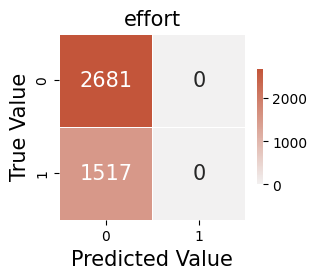

...

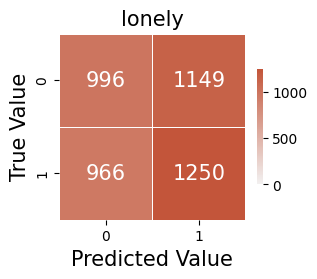

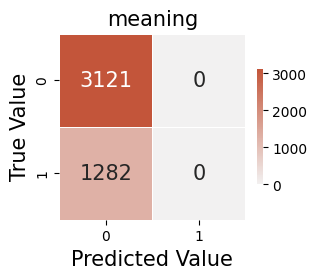

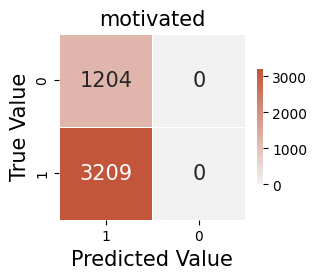

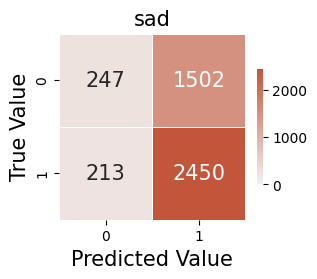

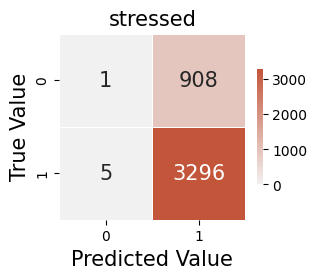

In [89]:
for outcome, o_df in evaluation_df_char.groupby("outcome"):

    cm_data = o_df.merge(peak_param_names_df)[
        ["pred_proba", "pred", "actual", "Female_split"]
    ]
    cm = (
        cm_data[["pred", "actual"]]
        .value_counts()
        .reset_index()
        .pivot_table(
            index=["actual"], columns=["pred"], values="count", aggfunc="first"
        )
        .astype(int)
    )
    if 0 not in cm.columns:
        cm[0] = 0
    if 1 not in cm.columns:
        cm[1] = 0
    fig, ax = plt.subplots(figsize=(3, 3))
    # annotate as integer not float
    plots.heatmap_correlation(
        cm,
        center=0,
        vmax=cm.max().max(),
        ax=ax,
        vmin=0,
        fmt=".0f",
        annot_kws={"fontsize": 15},
    )
    ax.set_ylabel("True Value", fontsize=15)
    ax.set_xlabel("Predicted Value", fontsize=15)
    ax.set_title(outcome, fontsize=15)

Text(0.5, 1.0, 'Inactive - Enjoy')

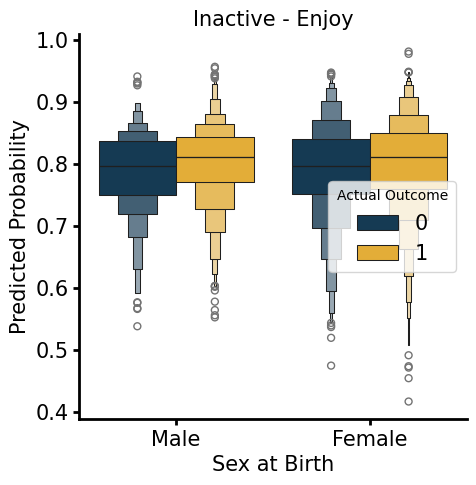

In [90]:
fig, ax = plt.subplots(figsize=(5, 5))
cm_data["Sex at Birth"] = cm_data["Female_split"].map({"low": "Male", "high": "Female"})
sns.boxenplot(
    data=cm_data,
    y="pred_proba",
    x="Sex at Birth",
    ax=ax,
    hue="actual",
    palette=[ucla_darkest_blue, ucla_darkest_gold],
)
fa.despine_thicken_axes(ax, fontsize=15)
ax.set_ylabel("Predicted Probability", fontsize=15)
ax.legend(loc="best", fontsize=15, title="Actual Outcome")
ax.set_title("Inactive - Enjoy", fontsize=15)
# Set xticklabels to False True

<Axes: xlabel='outcome', ylabel='split_type-split'>

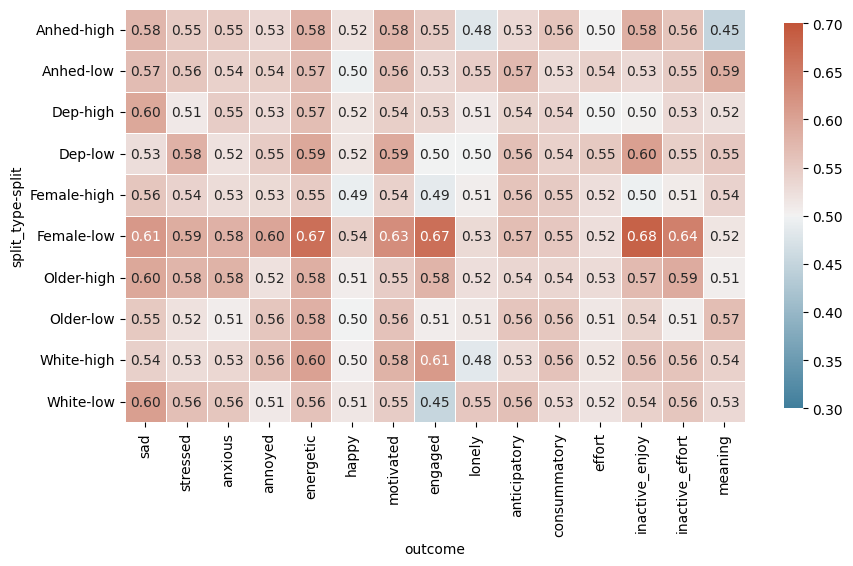

In [91]:
split_perf_table = (
    bootstrap_auroc_split_df.groupby(
        [
            "outcome",
            "split",
            "split_type",
        ]
    )
    .auroc.median()
    .unstack()
    .unstack()
)

fig, ax = plt.subplots(figsize=(10, 10))
plots.heatmap_correlation(
    split_perf_table.astype(float).T.reindex(columns=outcomes),
    vmin=0.3,
    vmax=0.7,
    center=0.5,
    ax=ax,
)

In [92]:
evaluation_df_char[(evaluation_df_char.outcome == "sad")].merge(peak_param_df).groupby(
    "Sex"
).actual.describe()

,count,mean,std,min,25%,50%,75%,max


# SHAP analysis

/var/folders/n5/2y22qmm94m583fwzs33kt5chmmbr8_/T/ipykernel_93022/3686219813.py:45: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  automl_pipeline = pickle.load(f)
/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator SimpleImputer from version 1.5.0 when using version 1.5.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://sc

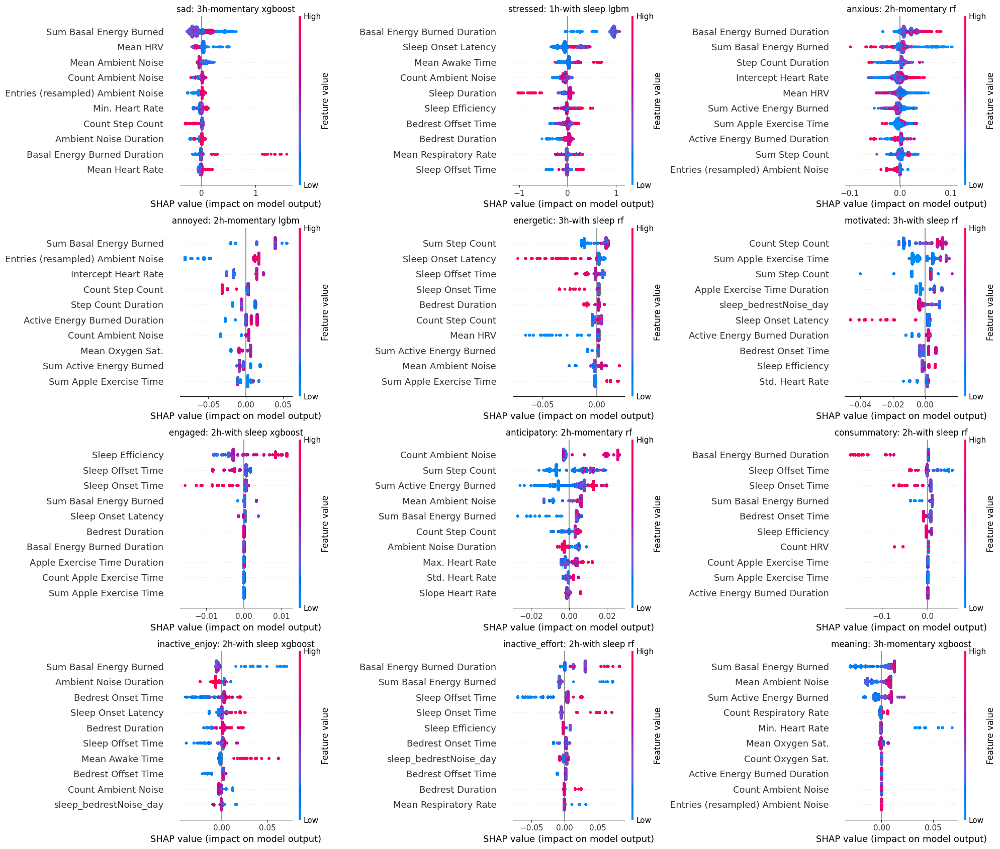

In [93]:
import shap

fig, axes = plt.subplots(figsize=(25 * 3, 15 * 4), nrows=4, ncols=3)
check_shap_outcomes = [
    o
    for o in outcomes
    if o in peak_param_df[peak_param_df.lower_auroc > 0.5].outcome.values
]
shap_dfs = []

for i, outcome in enumerate(check_shap_outcomes):
    row = peak_param_df[peak_param_df.outcome == outcome]
    feature_set_name = row.feature_set.values[0]
    window = row.window.values[0]
    feature_set_cols = feature_sets[feature_set_name]

    test_hk_ema_df = test_ema_piv.merge(
        window_hk[["user_id", "survey_start", *feature_set_cols]].rename(
            columns={"survey_start": "session_start"}
        ),
        on=["user_id", "session_start"],
    ).dropna(subset=[outcome])
    # set active axis to ax
    ax = axes.flatten()[i]
    plt.sca(ax)

    model_file = (
        cache_folder / f"{outcome}_{window}_{feature_set_name}{subusample_sufix}.pkl"
    )
    log_file = (
        cache_folder / f"{outcome}_{window}_{feature_set_name}{subusample_sufix}.log"
    )
    (
        time_history,
        best_valid_loss_history,
        valid_loss_history,
        config_history,
        metric_history,
    ) = get_output_from_log(filename=log_file, time_budget=time_budget)
    best_model_name = config_history[np.argmin(best_valid_loss_history)][
        "Current Learner"
    ]

    with open(model_file, "rb") as f:
        automl_pipeline = pickle.load(f)

    X = automl_pipeline.named_steps["standardizer"].transform(
        automl_pipeline.named_steps["imputer"].transform(
            test_hk_ema_df[feature_set_cols].to_numpy()
        )
    )
    y = test_hk_ema_df[outcome].astype(int)

    if (
        automl_pipeline.named_steps["automl"].model.estimator.__class__.__name__
        == "LogisticRegression"
    ):
        explainer = shap.LinearExplainer(
            automl_pipeline.named_steps["automl"].model.estimator,
            masker=shap.maskers.Impute(data=X),
        )
        explanation = explainer(X)
    else:
        explainer = shap.Explainer(
            automl_pipeline.named_steps["automl"].model.estimator
        )
        explanation = explainer(X, y)
    shap_values = explanation.values
    if len(shap_values.shape) == 3:
        shap_values = shap_values[:, :, 1]

    shap_df = pd.DataFrame(shap_values, columns=feature_set_cols)
    shap_df["outcome"] = outcome
    shap.summary_plot(
        shap_values,
        test_hk_ema_df[feature_set_cols]
        .rename(columns=passive_feature_map)
        .astype(float),
        show=False,
        sort=True,
        max_display=10,
        plot_size=(20, 17),
    )

    shap_dfs.append(shap_df)
    ax.set_title(
        f"{outcome}: {window}-{feature_set_name_map[feature_set_name]} {best_model_name}"
    )
# remove any remaining axes
if i < len(axes.flatten()) - 1:
    for ax in axes.flatten()[i + 1 :]:
        ax.remove()

plt.show()

In [94]:
feature_bases = [c.split("_")[0] for c in feature_sets["momentary_hk_sleep"]]
feature_color_map = {
    "audioExposure": "#95a5a6",
    "StepCount": "#1abc9c",
    "BasalEnergyBurned": "#16a085",
    "AppleExerciseTime": "#2ecc71",
    "ActiveEnergyBurned": "#27ae60",
    "RespiratoryRate": "#3498db",
    "OxygenSaturation": "#2980b9",
    "HeartRate": "#e74c3c",
    "HeartRateVariabilitySDNN": "#c0392b",
    "sleep": "#8e44ad",
}

column_colors = [feature_color_map[feature_base] for feature_base in feature_bases]
outcome_color_map = {
    "annoyed": ucla_blue,
    "anxious": ucla_blue,
    "energetic": ucla_blue,
    "engaged": ucla_blue,
    "effort": ucla_blue,
    "happy": ucla_blue,
    "meaning": ucla_blue,
    "motivated": ucla_blue,
    "sad": ucla_blue,
    "stressed": ucla_blue,
    "lonely": ucla_blue,
    "anticipatory": "lightgrey",
    "consummatory": "lightgrey",
    "inactive_effort": "lightgrey",
    "inactive_enjoy": "lightgrey",
}
row_colors = [outcome_color_map[outcome] for outcome in check_shap_outcomes]

In [95]:
all_shap_df = pd.concat(shap_dfs)

median_importance = all_shap_df.groupby("outcome").agg(lambda x: np.median(np.abs(x)))
for outcome in all_shap_df.outcome.unique():
    median_importance.loc[outcome, :] = median_importance.loc[
        outcome, :
    ]  # /base_median_importance[outcome]
median_importance = median_importance.reindex(check_shap_outcomes)
median_importance

,audioExposure_hours,audioExposure_mean,audioExposure_count,audioExposure_entries,StepCount_sum,StepCount_count,StepCount_duration,BasalEnergyBurned_sum,BasalEnergyBurned_count,BasalEnergyBurned_duration,...,sleep_sleepEfficiency_day,sleep_Awake_mean,sleep_Awake_count,sleep_bedrestNoise_day,sleep_sleepOnsetLatency_day,sleep_sleepOnsetHours_day,sleep_sleepOffsetHours_day,sleep_bedrestOffsetHours_day,sleep_bedrestOnsetHours_day,sleep_bedrestDuration_day
outcome,,,,,,,,,,,,,,,,,,,,,
sad,0.016455,0.043474,0.025220,0.011839,0.011177,0.013068,0.001274,0.138185,0.001334,0.005425,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
stressed,0.023114,0.020376,0.064752,0.000503,0.017444,0.000000,0.010317,0.007544,0.000938,0.945001,...,0.030398,0.026565,0.02428,0.037525,0.160397,0.008079,0.013209,0.037595,0.014643,0.045948
anxious,0.001292,0.001861,0.001626,0.003207,0.003181,0.001587,0.005026,0.005103,0.000835,0.009394,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
annoyed,0.000000,0.000000,0.004162,0.017927,0.000000,0.003780,0.012805,0.039594,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energetic,0.000000,0.001863,0.001044,0.000000,0.010709,0.004073,0.000000,0.000000,0.000000,0.000000,...,0.002081,0.000000,0.00000,0.000000,0.002093,0.001885,0.000959,0.000000,0.001711,0.001737
motivated,0.000000,0.000000,0.000000,0.000000,0.003356,0.010680,0.000000,0.000000,0.000000,0.000029,...,0.001863,0.000000,0.00000,0.003936,0.002311,0.000000,0.000000,0.000000,0.002129,0.000254
engaged,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000238,0.000000,0.000000,...,0.004019,0.000000,0.00000,0.000000,0.000248,0.000548,0.000570,0.000000,0.000000,0.000000
anticipatory,0.002531,0.006296,0.002904,0.000000,0.008676,0.003155,0.000000,0.004118,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consummatory,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009271,0.000000,0.001126,...,0.003266,0.000000,0.00000,0.000000,0.000000,0.005680,0.002730,0.000000,0.006442,0.000000


/Users/sakre/Code/dgc/WellcomeLeap/OPTIMA_momentary_ema_detection/.venv/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


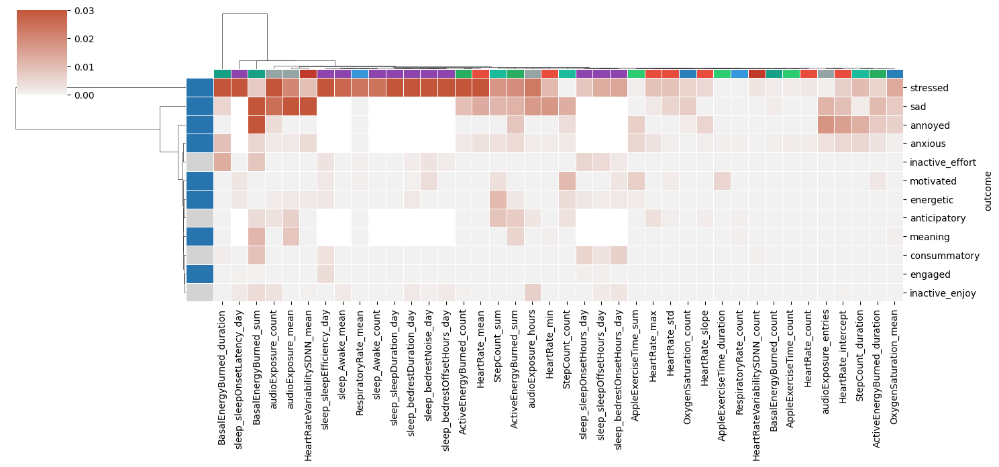

In [96]:
log_importance = pd.DataFrame(
    np.sign(median_importance.fillna(0))
    * np.log1p(np.abs(median_importance.fillna(0))),
    columns=median_importance.columns,
    index=median_importance.index,
)
log_importance = median_importance.fillna(0)
plots.clustermap_correlation(
    log_importance,
    annot=False,
    vmin=0,
    vmax=0.03,
    center=0,
    mask=median_importance.isna(),
    figsize=(15, 7),
    row_colors=row_colors,
    col_colors=column_colors,
)

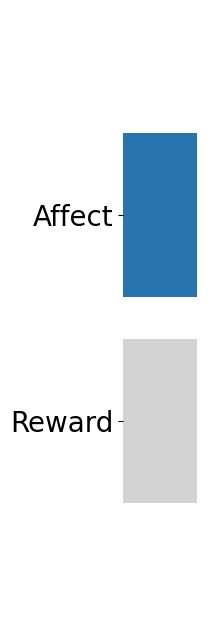

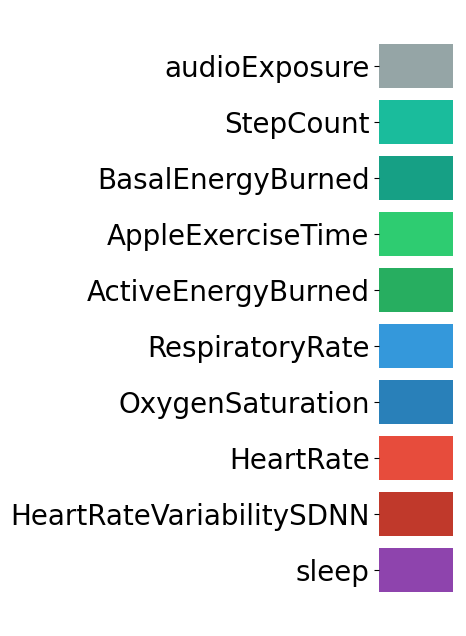

In [97]:
importlib.reload(plots)
plots.palplot({"Affect": ucla_blue, "Reward": "lightgrey"})
ax = plots.palplot(feature_color_map)